In [53]:
import random
import dill 
import datetime as dt
import glob 
from joblib import Parallel, delayed
import matplotlib.pyplot as plt
import pandas as pd
import scipy.spatial as spatial
import sys 
wd=".."
sys.path.append(wd+'//CPN//')
import numpy as np 
import statsmodels.api as sm
from tqdm import tqdm_notebook, tqdm
import brokenaxes
import math
import os
from analysis_misc_functions import *
import seaborn as sns

In [2]:
group_heading_variation = [0, 10, 30, 50, "swarming", "milling"]
list_of_folder_ids_all_heading_vars= []
list_of_folder_ids_array_version_all_heading_vars= []
for heading_var in group_heading_variation:
    results_folder = wd+"/simulations/effect_of_heading_plus_radial_no_unmasking/store_results/"+str(heading_var)+"/"
    list_of_folder_ids= glob.glob(results_folder+"*", recursive=True)
    list_of_folder_ids= np.sort(list_of_folder_ids)
    # # glob.glob(results_folder+"*")
    def clean_string_and_int_labels(input):
        try:
            output= float(input)
        except ValueError:
            output= input[1:-1]
        return output

    list_of_folder_ids= [str(i) for i in list_of_folder_ids]
    # list_of_folder_ids
    list_of_folder_ids_array_version= [i[len(results_folder):] for i in list_of_folder_ids]
    list_of_folder_ids_array_version= [i.split(",") for i in list_of_folder_ids_array_version]
    list_of_folder_ids_array_version= [(n[0][1:],n[1][1:], n[2][1:-1]) for n in list_of_folder_ids_array_version]
    list_of_folder_ids_array_version= [(float(n[0]), float(n[1]), clean_string_and_int_labels(n[2])) for n in list_of_folder_ids_array_version]


    list_of_folder_ids_all_heading_vars.append(list_of_folder_ids)
    list_of_folder_ids_array_version_all_heading_vars.append(list_of_folder_ids_array_version)

In [3]:
list_of_folder_ids_array_version[0][0]

1.0

In [4]:
folder_id= list_of_folder_ids_all_heading_vars[2][0]
all_results = glob.glob(folder_id+'/*.simresults')
some_results = random.sample(all_results, int(len(all_results)*1.0))
all_results

['../simulations/effect_of_heading_plus_radial_no_unmasking/store_results/30/(1, 1.5707963267948966, 30)/heading_plus_radial_no_unmasking_30_c9bbd4bd-752d-4c56-8e5d-dd34f2bcb9f8_109212018_.simresults',
 '../simulations/effect_of_heading_plus_radial_no_unmasking/store_results/30/(1, 1.5707963267948966, 30)/heading_plus_radial_no_unmasking_30_27fab3aa-10da-4c4b-ba40-d1eb4ddbbd5b_854672005_.simresults',
 '../simulations/effect_of_heading_plus_radial_no_unmasking/store_results/30/(1, 1.5707963267948966, 30)/heading_plus_radial_no_unmasking_30_c31e4cf7-c775-4531-838f-3e3902478c9c_701292772_.simresults',
 '../simulations/effect_of_heading_plus_radial_no_unmasking/store_results/30/(1, 1.5707963267948966, 30)/heading_plus_radial_no_unmasking_30_b016516d-8be5-42b7-b00a-2b62f1298a2c_796453235_.simresults',
 '../simulations/effect_of_heading_plus_radial_no_unmasking/store_results/30/(1, 1.5707963267948966, 30)/heading_plus_radial_no_unmasking_30_8d88ca5d-6e86-4dfa-bddc-5ff1f5d1438f_549431644_.sim

In [5]:
extraction_fns = [get_num_echoes_heard, get_group_size, get_furthest_bat2bat_distance,
                 get_nearest_neighbour_distances, get_detection_distance, get_run_uuid,
                  get_run_random_seed,make_paramset_id, extract_parameter_values,
                 get_echo_levels, get_detection_azimuth]
keyword_arguments = {'nearest_nbrs':3}

In [6]:
keyword_arguments['variables_to_extract'] = ['heading_variation', 'echocall_duration','atmospheric_attenuation','min_spacing','source_level',
                        'interpulse_interval', 'implement_shadowing',
                                            ]

In [7]:
what_to_do = input('Do you want to "rerun" from scratch or 2, "reanalyse" from previous data')
task_type= input('What type of analysis is this?')

In [8]:
what_to_do

'rerun'

In [9]:
# if what_to_do == 'rerun':
store_info= {}
for heading_var in group_heading_variation:
    index= group_heading_variation.index(heading_var)
    list_of_folder_ids= list_of_folder_ids_all_heading_vars[index]; list_of_folder_ids_array_version= list_of_folder_ids_array_version_all_heading_vars[index]
    array_containing_all_simulation_datasets_raw = []
    iterant=0
    yyyymmdd = dt.datetime.now()
    timestamp = str([yyyymmdd.year,yyyymmdd.month,yyyymmdd.day,yyyymmdd.hour])
    make_dir(task_type+'_data'+timestamp+"/")
    for folder_id in list_of_folder_ids:
        all_results = glob.glob(folder_id+'/*.simresults')
        some_results =random.sample(all_results, int(len(all_results)*1.0))
        
        %time extracted_simdata = Parallel(n_jobs=4)(delayed(load_and_extract)(each, extraction_fns, **keyword_arguments) for each in tqdm(some_results))
        # print(extracted_simdata)
        echoes_heard = []
        group_size = []
        group_diameter = []
        nearest_3nbrs = []
        nbr_detection_range = []
        uuid = []
        seed = []
        param_ids = []
        parameter_values = []
        echo_levels = []
        detection_angle = []
        for each in extracted_simdata:
            for variable, list_to_append in zip(each, [echoes_heard, group_size, group_diameter,
                                                    nearest_3nbrs, nbr_detection_range,
                                                    uuid, seed, param_ids, parameter_values,
                                                    echo_levels, detection_angle]):
                list_to_append.append(variable)
        simulation_data = pd.DataFrame(data = {'nbrs_detected':echoes_heard,
                                        'group_size':group_size,
                                        'group_diameter':group_diameter,
                                        'nearest_neighbour_distance':nearest_3nbrs,
                                        'nbrs_detected_distance':nbr_detection_range,
                                        'uuid':uuid,
                                        'seed':seed,
                                        'paramset_id':param_ids,
                                        'parameters_joint':parameter_values,
                                        'echo_levels':echo_levels,
                                        'detection_azimuth':detection_angle})
        column_names = keyword_arguments['variables_to_extract']

        for each in column_names:
            simulation_data[each] = np.nan

        %time simulation_data = simulation_data.apply(split_parameters_joint_to_separate_columns, 1, col_names=column_names)    
        

        simulation_data["focal_bat"]= len(simulation_data)*[list_of_folder_ids_array_version[iterant]]

        ##### thanks to https://realpython.com/fast-flexible-pandas/#but-i-heard-that-pandas-is-slow
        # data_store = pd.HDFStore(task_type+'_data'+timestamp+'/'+folder_id+'.h5')
        # data_store['simulation_data'] = simulation_data
        # data_store.close()

        array_containing_all_simulation_datasets_raw.append(simulation_data)
        iterant+=1
    store_info[heading_var]= array_containing_all_simulation_datasets_raw
        
# if what_to_do == 'reanalyse':
#     # show all datasets in the folder
#     data_stores_in_folder = glob.glob(task_type+'_*]')

#     datastores_by_index = pd.DataFrame(data={'data_stores':data_stores_in_folder})
#     print(datastores_by_index)
#     # user-inputs dataset choice:
#     which_dataset = int(input('Give the index of the dataset you want to'))
#     print()
#     # load a pre-exisiting dataset
#     #load the saved data 
#     list_of_h5_files_in_folder= making_glob_work_properly(datastores_by_index["data_stores"][which_dataset])
#     # print(list_of_h5_files_in_folder); print("./"+datastores_by_index["data_stores"][which_dataset]+'/*')
#     array_containing_all_simulation_datasets_raw = []
#     list_of_folder_ids, list_of_folder_ids_array_version= run_while_reanalysis_to_change_folder_ids(list_of_h5_files_in_folder)
#     for h5_file in list_of_h5_files_in_folder:
#         data_load = pd.HDFStore("./"+datastores_by_index["data_stores"][which_dataset]+'/'+h5_file)
#         simulation_data = data_load['simulation_data']
#         array_containing_all_simulation_datasets_raw.append(simulation_data)
#         data_load.close()

# else:
#     raise IOError('Invalid input given!!')

  0%|          | 0/600 [00:00<?, ?it/s]

100%|██████████| 600/600 [00:01<00:00, 481.99it/s]


CPU times: user 58.4 ms, sys: 7.73 ms, total: 66.1 ms
Wall time: 1.52 s
CPU times: user 33.3 ms, sys: 13 μs, total: 33.4 ms
Wall time: 33.4 ms


100%|██████████| 600/600 [00:00<00:00, 1342.17it/s]


CPU times: user 51.3 ms, sys: 6.21 ms, total: 57.5 ms
Wall time: 733 ms
CPU times: user 33.4 ms, sys: 16 μs, total: 33.4 ms
Wall time: 33.4 ms


100%|██████████| 500/500 [00:00<00:00, 1775.62it/s]


CPU times: user 41.6 ms, sys: 5.14 ms, total: 46.7 ms
Wall time: 600 ms
CPU times: user 73.2 ms, sys: 951 μs, total: 74.1 ms
Wall time: 74.2 ms


100%|██████████| 502/502 [00:00<00:00, 1790.52it/s]


CPU times: user 44.2 ms, sys: 5.07 ms, total: 49.3 ms
Wall time: 599 ms
CPU times: user 27.8 ms, sys: 0 ns, total: 27.8 ms
Wall time: 27.8 ms


100%|██████████| 400/400 [00:00<00:00, 1402.93it/s]


CPU times: user 35.8 ms, sys: 1.18 ms, total: 37 ms
Wall time: 470 ms
CPU times: user 23.9 ms, sys: 997 μs, total: 24.9 ms
Wall time: 24.9 ms


100%|██████████| 400/400 [00:00<00:00, 1450.01it/s]


CPU times: user 29.5 ms, sys: 4.93 ms, total: 34.4 ms
Wall time: 458 ms
CPU times: user 22.3 ms, sys: 12 μs, total: 22.3 ms
Wall time: 22.4 ms


100%|██████████| 299/299 [00:00<00:00, 1392.38it/s]


CPU times: user 31.3 ms, sys: 5.98 ms, total: 37.3 ms
Wall time: 367 ms
CPU times: user 15.9 ms, sys: 0 ns, total: 15.9 ms
Wall time: 15.9 ms


100%|██████████| 299/299 [00:00<00:00, 1366.21it/s]


CPU times: user 31 ms, sys: 5.89 ms, total: 36.9 ms
Wall time: 396 ms
CPU times: user 17.5 ms, sys: 0 ns, total: 17.5 ms
Wall time: 17.6 ms


100%|██████████| 200/200 [00:00<00:00, 1336.83it/s]


CPU times: user 19.6 ms, sys: 3.14 ms, total: 22.8 ms
Wall time: 254 ms
CPU times: user 11.5 ms, sys: 0 ns, total: 11.5 ms
Wall time: 11.5 ms


100%|██████████| 200/200 [00:00<00:00, 1286.42it/s]


CPU times: user 26.5 ms, sys: 0 ns, total: 26.5 ms
Wall time: 265 ms
CPU times: user 11.3 ms, sys: 0 ns, total: 11.3 ms
Wall time: 11.3 ms


100%|██████████| 100/100 [00:00<00:00, 1326.66it/s]


CPU times: user 12.8 ms, sys: 1.81 ms, total: 14.6 ms
Wall time: 143 ms
CPU times: user 6.01 ms, sys: 0 ns, total: 6.01 ms
Wall time: 6.02 ms


100%|██████████| 100/100 [00:00<00:00, 1372.46it/s]


CPU times: user 14 ms, sys: 503 μs, total: 14.5 ms
Wall time: 143 ms
CPU times: user 5.87 ms, sys: 0 ns, total: 5.87 ms
Wall time: 5.88 ms


0it [00:00, ?it/s]


CPU times: user 1.71 ms, sys: 0 ns, total: 1.71 ms
Wall time: 1.61 ms
CPU times: user 291 μs, sys: 2 μs, total: 293 μs
Wall time: 295 μs


0it [00:00, ?it/s]


CPU times: user 1.35 ms, sys: 0 ns, total: 1.35 ms
Wall time: 1.19 ms
CPU times: user 187 μs, sys: 0 ns, total: 187 μs
Wall time: 176 μs


100%|██████████| 600/600 [00:00<00:00, 1458.55it/s]


CPU times: user 52.2 ms, sys: 900 μs, total: 53.1 ms
Wall time: 680 ms
CPU times: user 32.4 ms, sys: 0 ns, total: 32.4 ms
Wall time: 32.5 ms


100%|██████████| 600/600 [00:00<00:00, 1412.62it/s]


CPU times: user 47.1 ms, sys: 4.85 ms, total: 51.9 ms
Wall time: 680 ms
CPU times: user 77.6 ms, sys: 0 ns, total: 77.6 ms
Wall time: 77.7 ms


100%|██████████| 500/500 [00:00<00:00, 1818.71it/s]


CPU times: user 41.4 ms, sys: 5.07 ms, total: 46.5 ms
Wall time: 568 ms
CPU times: user 27.8 ms, sys: 38 μs, total: 27.8 ms
Wall time: 27.8 ms


100%|██████████| 503/503 [00:00<00:00, 1805.07it/s]


CPU times: user 45.1 ms, sys: 5.12 ms, total: 50.3 ms
Wall time: 617 ms
CPU times: user 27.7 ms, sys: 0 ns, total: 27.7 ms
Wall time: 27.7 ms


100%|██████████| 400/400 [00:00<00:00, 1427.43it/s]


CPU times: user 32.8 ms, sys: 5.86 ms, total: 38.7 ms
Wall time: 478 ms
CPU times: user 24.6 ms, sys: 28 μs, total: 24.6 ms
Wall time: 24.6 ms


100%|██████████| 400/400 [00:00<00:00, 1426.65it/s]


CPU times: user 33.1 ms, sys: 2.96 ms, total: 36 ms
Wall time: 467 ms
CPU times: user 21.8 ms, sys: 0 ns, total: 21.8 ms
Wall time: 21.8 ms


100%|██████████| 299/299 [00:00<00:00, 1365.26it/s]


CPU times: user 33.3 ms, sys: 3.45 ms, total: 36.7 ms
Wall time: 365 ms
CPU times: user 16.5 ms, sys: 0 ns, total: 16.5 ms
Wall time: 16.4 ms


100%|██████████| 299/299 [00:00<00:00, 1266.30it/s]


CPU times: user 38.1 ms, sys: 5.08 ms, total: 43.2 ms
Wall time: 377 ms
CPU times: user 19.8 ms, sys: 0 ns, total: 19.8 ms
Wall time: 19.8 ms


100%|██████████| 200/200 [00:00<00:00, 1360.14it/s]


CPU times: user 20.7 ms, sys: 2.09 ms, total: 22.8 ms
Wall time: 254 ms
CPU times: user 11.5 ms, sys: 0 ns, total: 11.5 ms
Wall time: 11.5 ms


100%|██████████| 200/200 [00:00<00:00, 1322.80it/s]


CPU times: user 20.8 ms, sys: 2.94 ms, total: 23.8 ms
Wall time: 254 ms
CPU times: user 12.4 ms, sys: 0 ns, total: 12.4 ms
Wall time: 12.5 ms


100%|██████████| 100/100 [00:00<00:00, 1309.23it/s]


CPU times: user 11.4 ms, sys: 2.97 ms, total: 14.4 ms
Wall time: 142 ms
CPU times: user 6.17 ms, sys: 0 ns, total: 6.17 ms
Wall time: 6.18 ms


100%|██████████| 100/100 [00:00<00:00, 1280.43it/s]


CPU times: user 14.5 ms, sys: 1.81 ms, total: 16.3 ms
Wall time: 163 ms
CPU times: user 5.81 ms, sys: 0 ns, total: 5.81 ms
Wall time: 5.82 ms


0it [00:00, ?it/s]


CPU times: user 0 ns, sys: 1.64 ms, total: 1.64 ms
Wall time: 1.47 ms
CPU times: user 182 μs, sys: 10 μs, total: 192 μs
Wall time: 184 μs


0it [00:00, ?it/s]


CPU times: user 1.2 ms, sys: 11 μs, total: 1.21 ms
Wall time: 1.03 ms
CPU times: user 182 μs, sys: 6 μs, total: 188 μs
Wall time: 181 μs


100%|██████████| 600/600 [00:00<00:00, 1423.65it/s]


CPU times: user 45.2 ms, sys: 6.2 ms, total: 51.4 ms
Wall time: 689 ms
CPU times: user 80.5 ms, sys: 0 ns, total: 80.5 ms
Wall time: 80.6 ms


100%|██████████| 600/600 [00:00<00:00, 1445.29it/s]


CPU times: user 50.3 ms, sys: 5.28 ms, total: 55.6 ms
Wall time: 691 ms
CPU times: user 32.9 ms, sys: 989 μs, total: 33.9 ms
Wall time: 33.9 ms


100%|██████████| 501/501 [00:00<00:00, 1741.44it/s]


CPU times: user 43.3 ms, sys: 2.96 ms, total: 46.3 ms
Wall time: 578 ms
CPU times: user 27.4 ms, sys: 0 ns, total: 27.4 ms
Wall time: 27.4 ms


100%|██████████| 500/500 [00:00<00:00, 1862.26it/s]


CPU times: user 37.5 ms, sys: 4.9 ms, total: 42.4 ms
Wall time: 556 ms
CPU times: user 26.5 ms, sys: 0 ns, total: 26.5 ms
Wall time: 26.5 ms


100%|██████████| 400/400 [00:00<00:00, 1452.69it/s]


CPU times: user 26.3 ms, sys: 4.71 ms, total: 31 ms
Wall time: 458 ms
CPU times: user 21.7 ms, sys: 0 ns, total: 21.7 ms
Wall time: 21.7 ms


100%|██████████| 400/400 [00:00<00:00, 1438.17it/s]


CPU times: user 27.6 ms, sys: 4.85 ms, total: 32.5 ms
Wall time: 457 ms
CPU times: user 22.7 ms, sys: 10 μs, total: 22.7 ms
Wall time: 22.7 ms


100%|██████████| 297/297 [00:00<00:00, 1374.49it/s]


CPU times: user 39.2 ms, sys: 2.18 ms, total: 41.4 ms
Wall time: 375 ms
CPU times: user 16.3 ms, sys: 0 ns, total: 16.3 ms
Wall time: 16.5 ms


100%|██████████| 298/298 [00:00<00:00, 1304.97it/s]


CPU times: user 33.6 ms, sys: 6.61 ms, total: 40.2 ms
Wall time: 406 ms
CPU times: user 17.2 ms, sys: 12 μs, total: 17.3 ms
Wall time: 17.3 ms


100%|██████████| 200/200 [00:00<00:00, 1326.85it/s]


CPU times: user 24.8 ms, sys: 1.09 ms, total: 25.9 ms
Wall time: 265 ms
CPU times: user 11.9 ms, sys: 0 ns, total: 11.9 ms
Wall time: 11.9 ms


100%|██████████| 200/200 [00:00<00:00, 1264.35it/s]


CPU times: user 23 ms, sys: 2 ms, total: 25 ms
Wall time: 274 ms
CPU times: user 11.9 ms, sys: 0 ns, total: 11.9 ms
Wall time: 11.9 ms


100%|██████████| 100/100 [00:00<00:00, 878.59it/s]


CPU times: user 71.8 ms, sys: 1.95 ms, total: 73.7 ms
Wall time: 164 ms
CPU times: user 6.13 ms, sys: 5 μs, total: 6.13 ms
Wall time: 6.14 ms


100%|██████████| 100/100 [00:00<00:00, 1093.17it/s]


CPU times: user 19.5 ms, sys: 2.19 ms, total: 21.6 ms
Wall time: 164 ms
CPU times: user 6.1 ms, sys: 0 ns, total: 6.1 ms
Wall time: 6.1 ms


0it [00:00, ?it/s]


CPU times: user 1.56 ms, sys: 0 ns, total: 1.56 ms
Wall time: 1.31 ms
CPU times: user 232 μs, sys: 0 ns, total: 232 μs
Wall time: 226 μs


0it [00:00, ?it/s]


CPU times: user 345 μs, sys: 966 μs, total: 1.31 ms
Wall time: 1.07 ms
CPU times: user 178 μs, sys: 4 μs, total: 182 μs
Wall time: 179 μs


100%|██████████| 600/600 [00:00<00:00, 1403.42it/s]


CPU times: user 49.2 ms, sys: 7.85 ms, total: 57.1 ms
Wall time: 699 ms
CPU times: user 31 ms, sys: 994 μs, total: 32 ms
Wall time: 32 ms


100%|██████████| 600/600 [00:00<00:00, 1452.71it/s]


CPU times: user 45.8 ms, sys: 2.28 ms, total: 48.1 ms
Wall time: 678 ms
CPU times: user 33.3 ms, sys: 0 ns, total: 33.3 ms
Wall time: 33.6 ms


100%|██████████| 502/502 [00:00<00:00, 1656.78it/s]


CPU times: user 39.2 ms, sys: 4.44 ms, total: 43.6 ms
Wall time: 611 ms
CPU times: user 27.4 ms, sys: 16 μs, total: 27.4 ms
Wall time: 27.4 ms


100%|██████████| 500/500 [00:00<00:00, 1794.83it/s]


CPU times: user 37.9 ms, sys: 9.15 ms, total: 47.1 ms
Wall time: 599 ms
CPU times: user 27.1 ms, sys: 0 ns, total: 27.1 ms
Wall time: 27.1 ms


100%|██████████| 400/400 [00:00<00:00, 1386.15it/s]


CPU times: user 33.2 ms, sys: 5.08 ms, total: 38.3 ms
Wall time: 487 ms
CPU times: user 21.2 ms, sys: 954 μs, total: 22.2 ms
Wall time: 22.1 ms


100%|██████████| 400/400 [00:00<00:00, 1404.67it/s]


CPU times: user 33.2 ms, sys: 5.09 ms, total: 38.3 ms
Wall time: 520 ms
CPU times: user 22 ms, sys: 0 ns, total: 22 ms
Wall time: 22.1 ms


100%|██████████| 300/300 [00:00<00:00, 1344.41it/s]


CPU times: user 32.9 ms, sys: 5.3 ms, total: 38.2 ms
Wall time: 377 ms
CPU times: user 15.5 ms, sys: 970 μs, total: 16.5 ms
Wall time: 16.5 ms


100%|██████████| 299/299 [00:00<00:00, 1303.48it/s]


CPU times: user 34.8 ms, sys: 5.07 ms, total: 39.9 ms
Wall time: 386 ms
CPU times: user 16.6 ms, sys: 0 ns, total: 16.6 ms
Wall time: 16.6 ms


100%|██████████| 200/200 [00:00<00:00, 1252.65it/s]


CPU times: user 22.5 ms, sys: 2.99 ms, total: 25.4 ms
Wall time: 276 ms
CPU times: user 11.3 ms, sys: 0 ns, total: 11.3 ms
Wall time: 11.3 ms


100%|██████████| 200/200 [00:00<00:00, 1328.61it/s]


CPU times: user 83.5 ms, sys: 2.11 ms, total: 85.7 ms
Wall time: 267 ms
CPU times: user 11.2 ms, sys: 7 μs, total: 11.2 ms
Wall time: 11.2 ms


100%|██████████| 100/100 [00:00<00:00, 1214.05it/s]


CPU times: user 15 ms, sys: 3.06 ms, total: 18.1 ms
Wall time: 173 ms
CPU times: user 6.5 ms, sys: 0 ns, total: 6.5 ms
Wall time: 6.51 ms


100%|██████████| 100/100 [00:00<00:00, 1202.51it/s]


CPU times: user 18 ms, sys: 2.07 ms, total: 20 ms
Wall time: 163 ms
CPU times: user 7.29 ms, sys: 0 ns, total: 7.29 ms
Wall time: 7.29 ms


0it [00:00, ?it/s]


CPU times: user 1.9 ms, sys: 0 ns, total: 1.9 ms
Wall time: 1.7 ms
CPU times: user 239 μs, sys: 0 ns, total: 239 μs
Wall time: 228 μs


0it [00:00, ?it/s]


CPU times: user 1.39 ms, sys: 6 μs, total: 1.4 ms
Wall time: 1.2 ms
CPU times: user 260 μs, sys: 0 ns, total: 260 μs
Wall time: 233 μs


100%|██████████| 600/600 [00:00<00:00, 1241.96it/s]


CPU times: user 55.1 ms, sys: 8.31 ms, total: 63.4 ms
Wall time: 779 ms
CPU times: user 32.1 ms, sys: 0 ns, total: 32.1 ms
Wall time: 32.1 ms


100%|██████████| 600/600 [00:00<00:00, 1404.92it/s]


CPU times: user 48.8 ms, sys: 2.94 ms, total: 51.8 ms
Wall time: 698 ms
CPU times: user 32.4 ms, sys: 0 ns, total: 32.4 ms
Wall time: 32.4 ms


100%|██████████| 500/500 [00:00<00:00, 1677.69it/s]


CPU times: user 44 ms, sys: 1.24 ms, total: 45.3 ms
Wall time: 608 ms
CPU times: user 28 ms, sys: 0 ns, total: 28 ms
Wall time: 28 ms


100%|██████████| 501/501 [00:00<00:00, 1720.85it/s]


CPU times: user 43.2 ms, sys: 2.06 ms, total: 45.3 ms
Wall time: 599 ms
CPU times: user 26.3 ms, sys: 0 ns, total: 26.3 ms
Wall time: 26.4 ms


100%|██████████| 400/400 [00:00<00:00, 1443.07it/s]


CPU times: user 31.9 ms, sys: 2.16 ms, total: 34.1 ms
Wall time: 473 ms
CPU times: user 22.1 ms, sys: 0 ns, total: 22.1 ms
Wall time: 22.1 ms


100%|██████████| 400/400 [00:00<00:00, 1410.82it/s]


CPU times: user 28.7 ms, sys: 4.11 ms, total: 32.8 ms
Wall time: 467 ms
CPU times: user 21.9 ms, sys: 0 ns, total: 21.9 ms
Wall time: 21.8 ms


100%|██████████| 299/299 [00:00<00:00, 1354.18it/s]


CPU times: user 37.5 ms, sys: 938 μs, total: 38.5 ms
Wall time: 365 ms
CPU times: user 16.2 ms, sys: 0 ns, total: 16.2 ms
Wall time: 16.2 ms


100%|██████████| 300/300 [00:00<00:00, 1241.95it/s]


CPU times: user 36.2 ms, sys: 4.1 ms, total: 40.3 ms
Wall time: 407 ms
CPU times: user 16.5 ms, sys: 0 ns, total: 16.5 ms
Wall time: 16.5 ms


100%|██████████| 200/200 [00:00<00:00, 1261.91it/s]


CPU times: user 23.5 ms, sys: 4.12 ms, total: 27.6 ms
Wall time: 274 ms
CPU times: user 11.7 ms, sys: 0 ns, total: 11.7 ms
Wall time: 11.8 ms


100%|██████████| 200/200 [00:00<00:00, 1288.79it/s]


CPU times: user 19.8 ms, sys: 1.76 ms, total: 21.5 ms
Wall time: 264 ms
CPU times: user 11.3 ms, sys: 7 μs, total: 11.3 ms
Wall time: 11.3 ms


100%|██████████| 100/100 [00:00<00:00, 1316.20it/s]


CPU times: user 11.6 ms, sys: 2.33 ms, total: 13.9 ms
Wall time: 143 ms
CPU times: user 6.05 ms, sys: 0 ns, total: 6.05 ms
Wall time: 6.02 ms


100%|██████████| 100/100 [00:00<00:00, 1349.97it/s]


CPU times: user 15.3 ms, sys: 1.5 ms, total: 16.8 ms
Wall time: 143 ms
CPU times: user 5.87 ms, sys: 0 ns, total: 5.87 ms
Wall time: 5.87 ms


0it [00:00, ?it/s]


CPU times: user 871 μs, sys: 904 μs, total: 1.78 ms
Wall time: 1.66 ms
CPU times: user 203 μs, sys: 11 μs, total: 214 μs
Wall time: 207 μs


0it [00:00, ?it/s]


CPU times: user 0 ns, sys: 1.54 ms, total: 1.54 ms
Wall time: 1.31 ms
CPU times: user 194 μs, sys: 0 ns, total: 194 μs
Wall time: 189 μs


100%|██████████| 600/600 [00:00<00:00, 1405.55it/s]


CPU times: user 47.5 ms, sys: 6.78 ms, total: 54.3 ms
Wall time: 692 ms
CPU times: user 88.7 ms, sys: 0 ns, total: 88.7 ms
Wall time: 88.8 ms


100%|██████████| 600/600 [00:00<00:00, 1464.07it/s]


CPU times: user 39.7 ms, sys: 5.59 ms, total: 45.3 ms
Wall time: 668 ms
CPU times: user 32.2 ms, sys: 0 ns, total: 32.2 ms
Wall time: 32.2 ms


100%|██████████| 501/501 [00:00<00:00, 1712.99it/s]


CPU times: user 41.4 ms, sys: 7.19 ms, total: 48.6 ms
Wall time: 590 ms
CPU times: user 26.8 ms, sys: 0 ns, total: 26.8 ms
Wall time: 26.8 ms


100%|██████████| 500/500 [00:00<00:00, 1811.93it/s]


CPU times: user 42.6 ms, sys: 3.2 ms, total: 45.8 ms
Wall time: 583 ms
CPU times: user 24.7 ms, sys: 977 μs, total: 25.7 ms
Wall time: 25.7 ms


100%|██████████| 400/400 [00:00<00:00, 1415.61it/s]


CPU times: user 34.3 ms, sys: 2.02 ms, total: 36.3 ms
Wall time: 477 ms
CPU times: user 21.7 ms, sys: 0 ns, total: 21.7 ms
Wall time: 21.7 ms


100%|██████████| 400/400 [00:00<00:00, 1396.66it/s]


CPU times: user 30.5 ms, sys: 6.76 ms, total: 37.3 ms
Wall time: 468 ms
CPU times: user 21.4 ms, sys: 956 μs, total: 22.4 ms
Wall time: 22.3 ms


100%|██████████| 298/298 [00:00<00:00, 1392.44it/s]


CPU times: user 30.4 ms, sys: 3.03 ms, total: 33.4 ms
Wall time: 357 ms
CPU times: user 21.7 ms, sys: 0 ns, total: 21.7 ms
Wall time: 21.7 ms


100%|██████████| 300/300 [00:00<00:00, 1268.47it/s]


CPU times: user 35.4 ms, sys: 6.07 ms, total: 41.4 ms
Wall time: 396 ms
CPU times: user 16.5 ms, sys: 0 ns, total: 16.5 ms
Wall time: 16.5 ms


100%|██████████| 200/200 [00:00<00:00, 1171.90it/s]


CPU times: user 16 ms, sys: 4.78 ms, total: 20.7 ms
Wall time: 275 ms
CPU times: user 11.3 ms, sys: 0 ns, total: 11.3 ms
Wall time: 11.3 ms


100%|██████████| 200/200 [00:00<00:00, 1213.32it/s]


CPU times: user 21.8 ms, sys: 4.13 ms, total: 26 ms
Wall time: 274 ms
CPU times: user 11.2 ms, sys: 3 μs, total: 11.2 ms
Wall time: 11.2 ms


100%|██████████| 100/100 [00:00<00:00, 1304.75it/s]


CPU times: user 18 ms, sys: 30 μs, total: 18 ms
Wall time: 143 ms
CPU times: user 6.3 ms, sys: 0 ns, total: 6.3 ms
Wall time: 6.27 ms


100%|██████████| 100/100 [00:00<00:00, 1269.85it/s]


CPU times: user 16.3 ms, sys: 3.95 ms, total: 20.3 ms
Wall time: 164 ms
CPU times: user 6.06 ms, sys: 0 ns, total: 6.06 ms
Wall time: 6.08 ms


0it [00:00, ?it/s]


CPU times: user 1.6 ms, sys: 0 ns, total: 1.6 ms
Wall time: 1.5 ms
CPU times: user 226 μs, sys: 0 ns, total: 226 μs
Wall time: 221 μs


0it [00:00, ?it/s]

CPU times: user 358 μs, sys: 942 μs, total: 1.3 ms
Wall time: 1.09 ms
CPU times: user 181 μs, sys: 4 μs, total: 185 μs
Wall time: 178 μs


In [10]:
array_containing_all_simulation_datasets_raw[-1]["focal_bat"]

Series([], Name: focal_bat, dtype: float64)

In [11]:
for i in range(len(array_containing_all_simulation_datasets_raw)):
    try:
        print(array_containing_all_simulation_datasets_raw[i]["focal_bat"][0])
    except KeyError:
        continue

(1.0, 1.5707963267948966, 'milling')
(1.0, 4.71238898038469, 'milling')
(2.0, 1.5707963267948966, 'milling')
(2.0, 4.71238898038469, 'milling')
(3.0, 1.5707963267948966, 'milling')
(3.0, 4.71238898038469, 'milling')
(4.0, 1.5707963267948966, 'milling')
(4.0, 4.71238898038469, 'milling')
(5.0, 1.5707963267948966, 'milling')
(5.0, 4.71238898038469, 'milling')
(6.0, 1.5707963267948966, 'milling')
(6.0, 4.71238898038469, 'milling')


In [15]:
array_containing_all_simulation_datasets=[]
array_containing_labels= []
for simulation_data in array_containing_all_simulation_datasets_raw:
    try:
        if simulation_data["focal_bat"][0][2]==0:
            array_containing_all_simulation_datasets.append(simulation_data)
            array_containing_labels.append(simulation_data["focal_bat"][0])
    except KeyError:
        continue
array_containing_all_simulation_datasets
array_containing_labels= np.array(array_containing_labels)

In [16]:
array_containing_labels

array([], dtype=float64)

In [14]:

unique_angles_in_dataset= np.unique(array_containing_labels[:,1])
list_containing_simulated_data_sorted_by_angles= {}
print(unique_angles_in_dataset)
for angle in unique_angles_in_dataset:
    list_containing_simulated_data_sorted_by_angles[angle]= []
    sublist_true_false_labels= array_containing_labels[:,1]==angle
    sublist_given_angle= passing_true_false_indices_through_lists(array_containing_all_simulation_datasets, sublist_true_false_labels)
    list_containing_simulated_data_sorted_by_angles[angle].append(sublist_given_angle)

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

In [ ]:
simulation_data["focal_bat"]

Series([], Name: focal_bat, dtype: float64)

In [ ]:
for simulation_data in array_containing_all_simulation_datasets:
    print(np.unique(simulation_data["group_size"]))

[10 30 50 75]
[30 50]
[5]
[20 50]
[30 50]
[75]
[75]
[75]


In [ ]:
array_containing_all_simulation_datasets[1]["focal_bat"]

0      [1.0, 4.71238898038469, 0.0]
1      [1.0, 4.71238898038469, 0.0]
2      [1.0, 4.71238898038469, 0.0]
3      [1.0, 4.71238898038469, 0.0]
4      [1.0, 4.71238898038469, 0.0]
                   ...             
160    [1.0, 4.71238898038469, 0.0]
161    [1.0, 4.71238898038469, 0.0]
162    [1.0, 4.71238898038469, 0.0]
163    [1.0, 4.71238898038469, 0.0]
164    [1.0, 4.71238898038469, 0.0]
Name: focal_bat, Length: 165, dtype: object

In [17]:
%matplotlib inline
i=0
for angle in list_containing_simulated_data_sorted_by_angles.keys():
    subset_given_angle= list_containing_simulated_data_sorted_by_angles[angle][0]
    print(angle)
    for simulation_data in subset_given_angle:
        plt.plot(simulation_data['group_size'],
                    simulation_data['group_diameter'], 
                '*',label=simulation_data["focal_bat"][0][0],alpha=0.2)
        i+=1
    plt.legend()
    plt.show()

NameError: name 'list_containing_simulated_data_sorted_by_angles' is not defined

In [ ]:
simulation_data.keys()

Index(['nbrs_detected', 'group_size', 'group_diameter',
       'nearest_neighbour_distance', 'nbrs_detected_distance', 'uuid', 'seed',
       'paramset_id', 'parameters_joint', 'echo_levels', 'detection_azimuth',
       'heading_variation', 'echocall_duration', 'atmospheric_attenuation',
       'min_spacing', 'source_level', 'interpulse_interval',
       'implement_shadowing', 'focal_bat'],
      dtype='object')

In [ ]:
by_minspacing = simulation_data.groupby('min_spacing')
nearest_nbr_dist = {}
for spacing, df in by_minspacing:
    nearest_nbr_distances = df['nearest_neighbour_distance'].reset_index(drop=True)
    nearest_nbr_dist[spacing] = np.concatenate(nearest_nbr_distances)
nearest_nbr_dists_for_plot = [nearest_nbr_dist[0.5]]

In [18]:
iterant1_axis=0
# fig, axs = plt.subplots(1,3, figsize=(27,9))


for angle in list_containing_simulated_data_sorted_by_angles.keys():
        subset_given_angle= list_containing_simulated_data_sorted_by_angles[angle][0]; iterant2_color=0
        
        plt.figure(figsize=(21,10))
        i=1
        for simulation_data in subset_given_angle:
                data_by_groupsize = simulation_data.groupby(['group_size'])
                nbrs_detected_data = {}
                nbrs_detected_data['num_nbrs'] = []
                nbrs_detected_data['median_num_nbrs'] = []
                nbrs_detected_data['90%ile_num_nbrs'] = []
                groupsizes= []
                for groupsize, dataframe in data_by_groupsize:
                        groupsizes.append(groupsize)
                        nbrs_detected_data['num_nbrs'].append(np.array(dataframe['nbrs_detected']))
                        nbrs_detected_data['median_num_nbrs'].append(np.median(np.array(dataframe['nbrs_detected'])))
                        nbrs_detected_data['90%ile_num_nbrs'].append(np.percentile(np.array(dataframe['nbrs_detected']), 90))

                breakup_x_axis  = np.arange(1,len(groupsizes)+1)+0.5
                nbrs_detected_data['median_num_nbrs']

                # plt.figure(figsize=(7,3.42))
                plt.subplot(2,3,i)
                plt.violinplot(nbrs_detected_data['num_nbrs'][:], showextrema=False)
                plt.plot(np.arange(1,len(groupsizes)+1),nbrs_detected_data['median_num_nbrs'][:],
                        '--*',linewidth=2, alpha=0.5,label="median, r="+str(simulation_data["focal_bat"][0]))#'median')
                # print(np.arange(1,len(groupsizes)))
                plt.plot(np.arange(1,len(groupsizes)+1), nbrs_detected_data['90%ile_num_nbrs'][:],
                        '-..',linewidth=2, alpha=0.5, label="90% percentile, r="+str(simulation_data["focal_bat"][0]))#label='90%ile')
                # plt.vlines(breakup_x_axis, -1,20, 'w',linewidth=30,alpha=1.0)
                plt.yticks(np.arange(0,21,1))
                plt.xticks(range(1,len(groupsizes)+1),groupsizes[:])
                plt.legend(fontsize=8)
                plt.ylabel('Neighbours detected \n per call emission', fontsize=10)
                plt.xlabel('Group size', fontsize=10)
                # # plt.ylim(0,20)

                # axs[i].tight_layout()
                plt.title("neighbours detected when focal bat is at angle "+str(np.degrees(np.pi/2)))
                iterant2_color+=1; i+=1
                
        iterant1_axis+=1
                # plt.savefig('Figure2_groupsize_1200dpi.pdf',
                #         bbox_inches='tight', pad_inches=0.05, format='pdf', dpi=1200)
        
        # print(groupsizes); print(nbrs_detected_data['median_num_nbrs'])

NameError: name 'list_containing_simulated_data_sorted_by_angles' is not defined

In [ ]:
store_info[10]

[     nbrs_detected  group_size  group_diameter  \
 0                1          50        4.981982   
 1                6          30        3.946143   
 2                3           5        1.036136   
 3                2          75        6.192973   
 4                8          10        2.002688   
 ..             ...         ...             ...   
 595              5          10        1.943582   
 596              2          50        4.839177   
 597              2           5        1.200109   
 598              1          20        2.878849   
 599              9          10        2.060233   
 
                             nearest_neighbour_distance  \
 0    [0.5076035912419788, 0.6218724544540727, 0.723...   
 1    [0.5107568558491086, 0.5196964536957928, 0.589...   
 2    [0.5469686704053571, 0.6959014348986038, 1.004...   
 3    [0.5267014784423539, 0.5412405256680821, 0.579...   
 4    [0.5055593736512486, 0.5069042955012203, 0.570...   
 ..                             

0
[[1.         1.57079633 0.        ]
 [1.         4.71238898 0.        ]
 [2.         1.57079633 0.        ]
 [2.         4.71238898 0.        ]
 [3.         1.57079633 0.        ]
 [3.         4.71238898 0.        ]
 [4.         1.57079633 0.        ]
 [4.         4.71238898 0.        ]
 [5.         1.57079633 0.        ]
 [5.         4.71238898 0.        ]
 [6.         1.57079633 0.        ]
 [6.         4.71238898 0.        ]]
[1.57079633 4.71238898]
0
2
4
6
8
10
1
3
5
7
9
11
1.5707963267948966


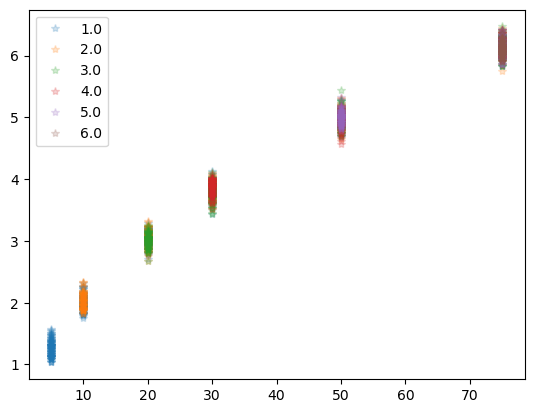

4.71238898038469


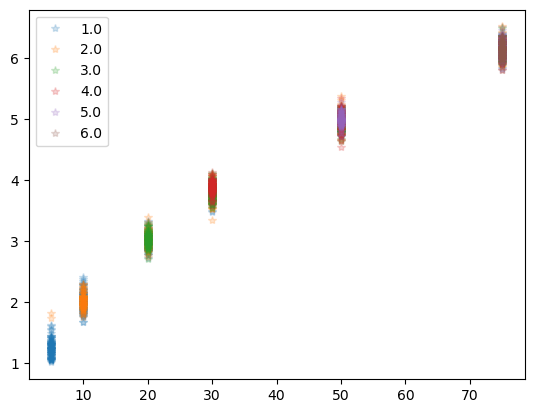

10
[[ 1.          1.57079633 10.        ]
 [ 1.          4.71238898 10.        ]
 [ 2.          1.57079633 10.        ]
 [ 2.          4.71238898 10.        ]
 [ 3.          1.57079633 10.        ]
 [ 3.          4.71238898 10.        ]
 [ 4.          1.57079633 10.        ]
 [ 4.          4.71238898 10.        ]
 [ 5.          1.57079633 10.        ]
 [ 5.          4.71238898 10.        ]
 [ 6.          1.57079633 10.        ]
 [ 6.          4.71238898 10.        ]]
[1.57079633 4.71238898]
0
2
4
6
8
10
1
3
5
7
9
11
1.5707963267948966


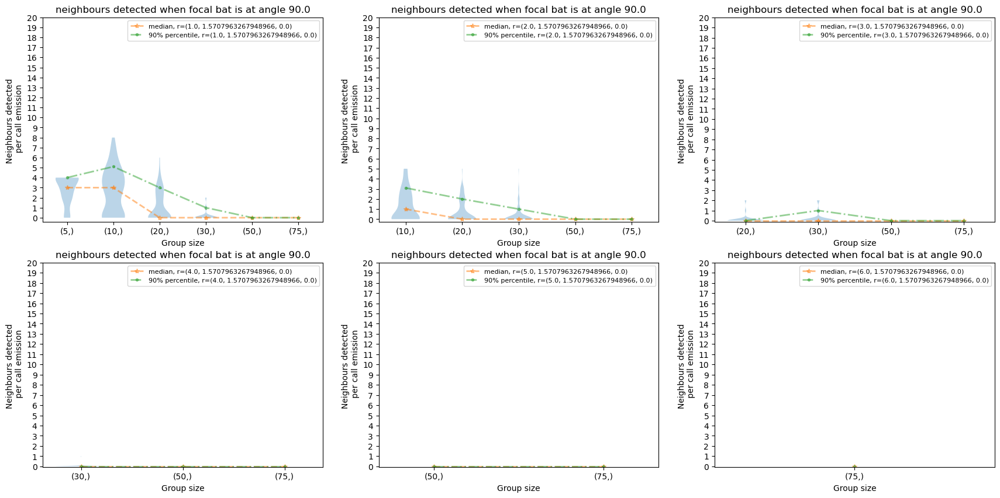

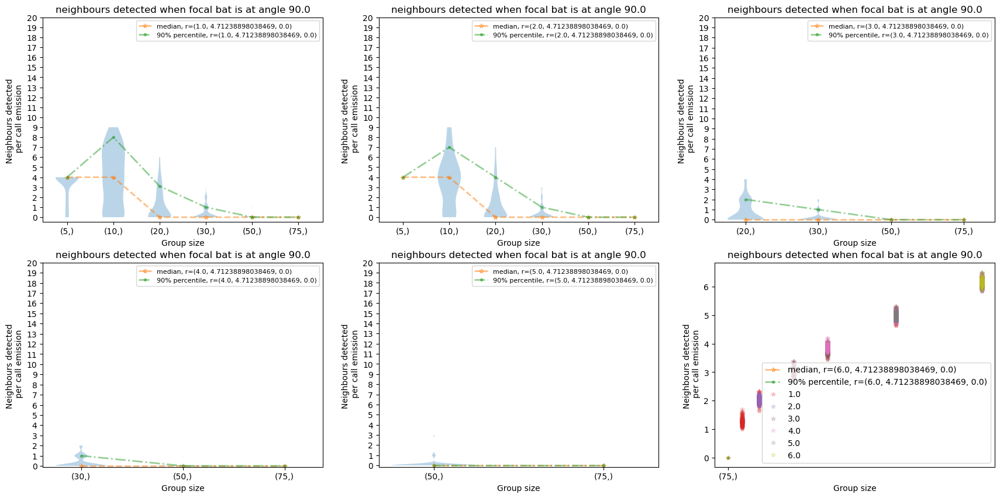

4.71238898038469


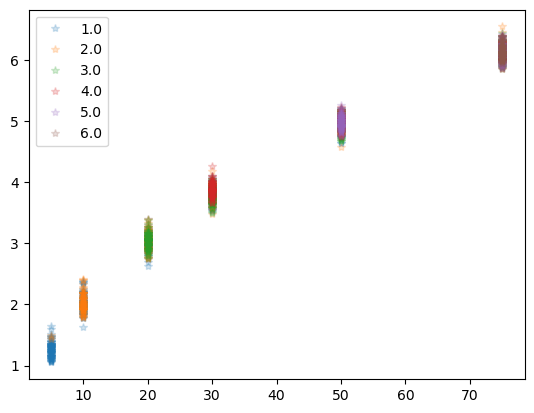

30
[[ 1.          1.57079633 30.        ]
 [ 1.          4.71238898 30.        ]
 [ 2.          1.57079633 30.        ]
 [ 2.          4.71238898 30.        ]
 [ 3.          1.57079633 30.        ]
 [ 3.          4.71238898 30.        ]
 [ 4.          1.57079633 30.        ]
 [ 4.          4.71238898 30.        ]
 [ 5.          1.57079633 30.        ]
 [ 5.          4.71238898 30.        ]
 [ 6.          1.57079633 30.        ]
 [ 6.          4.71238898 30.        ]]
[1.57079633 4.71238898]
0
2
4
6
8
10
1
3
5
7
9
11
1.5707963267948966


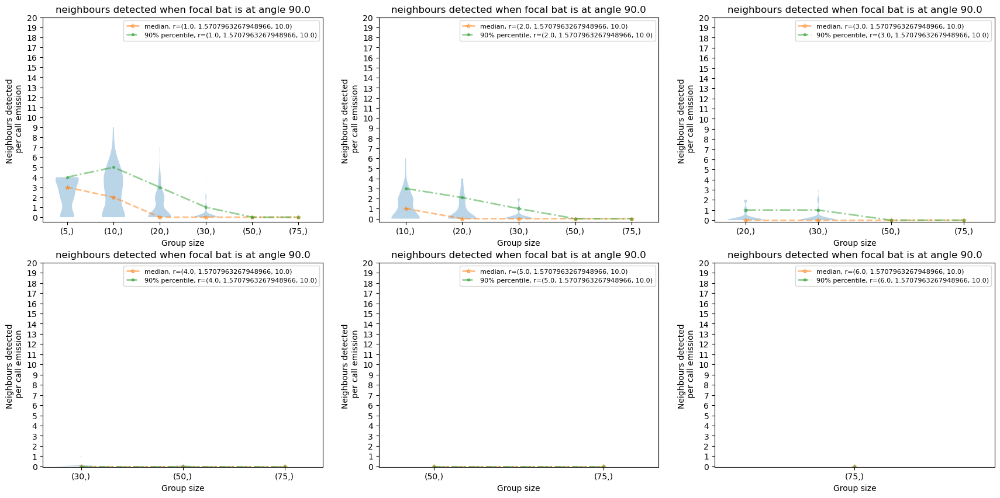

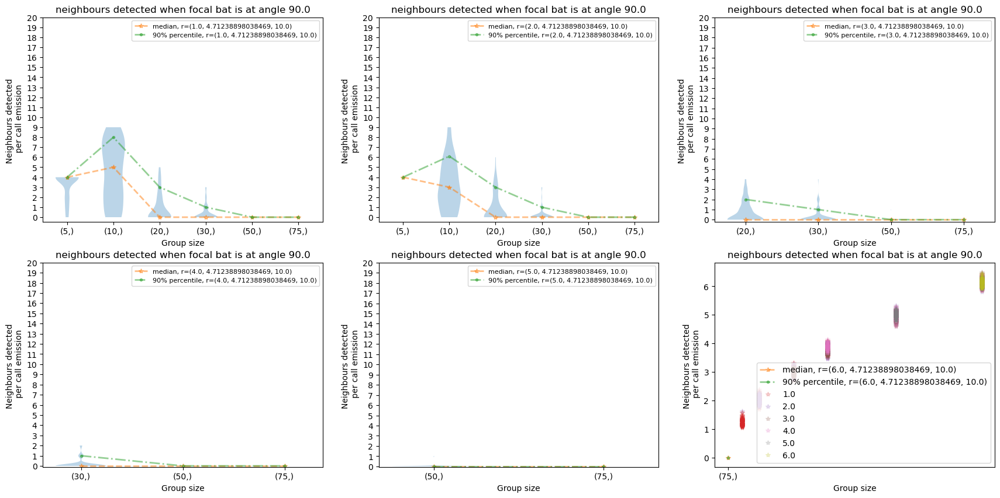

4.71238898038469


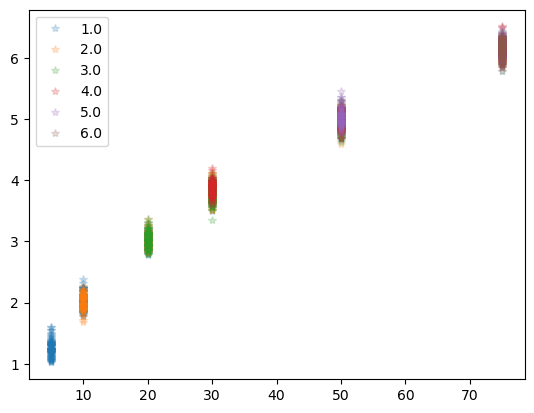

50
[[ 1.          1.57079633 50.        ]
 [ 1.          4.71238898 50.        ]
 [ 2.          1.57079633 50.        ]
 [ 2.          4.71238898 50.        ]
 [ 3.          1.57079633 50.        ]
 [ 3.          4.71238898 50.        ]
 [ 4.          1.57079633 50.        ]
 [ 4.          4.71238898 50.        ]
 [ 5.          1.57079633 50.        ]
 [ 5.          4.71238898 50.        ]
 [ 6.          1.57079633 50.        ]
 [ 6.          4.71238898 50.        ]]
[1.57079633 4.71238898]
0
2
4
6
8
10
1
3
5
7
9
11
1.5707963267948966


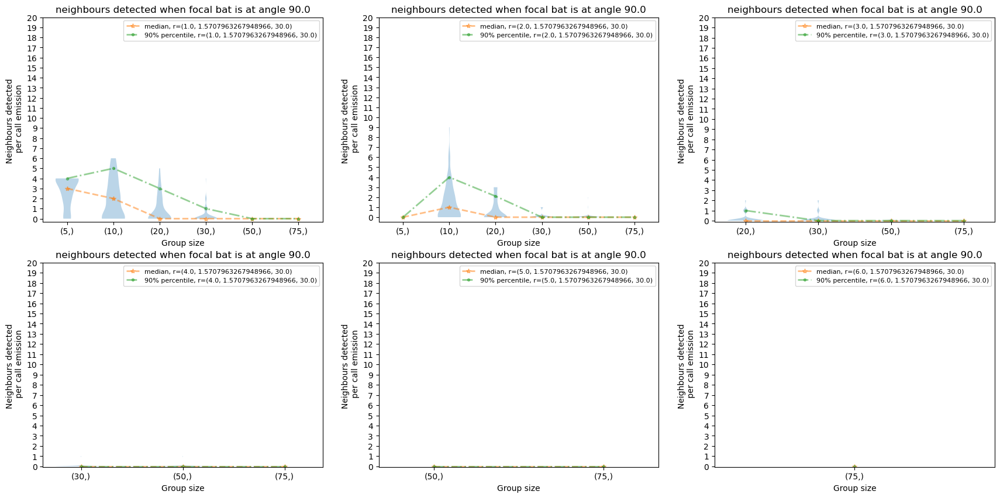

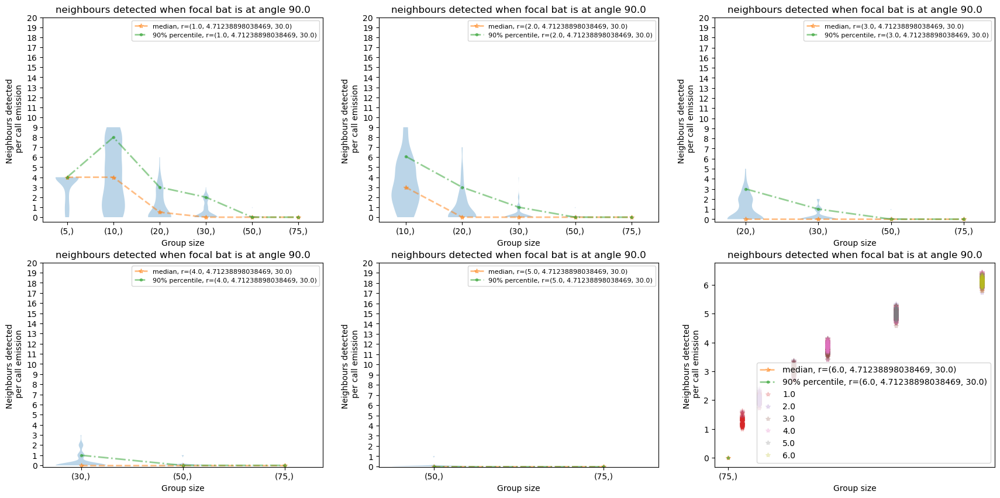

4.71238898038469


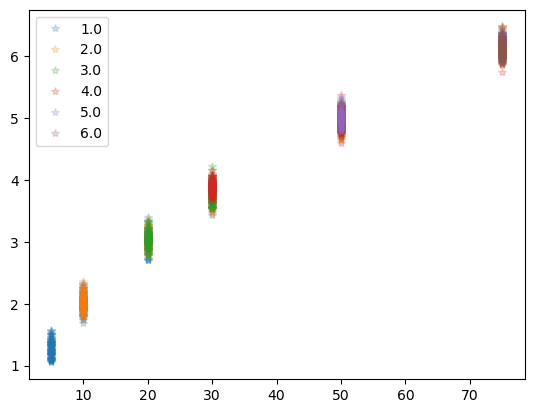

milling
[['1.0' '1.5707963267948966' 'milling']
 ['1.0' '4.71238898038469' 'milling']
 ['2.0' '1.5707963267948966' 'milling']
 ['2.0' '4.71238898038469' 'milling']
 ['3.0' '1.5707963267948966' 'milling']
 ['3.0' '4.71238898038469' 'milling']
 ['4.0' '1.5707963267948966' 'milling']
 ['4.0' '4.71238898038469' 'milling']
 ['5.0' '1.5707963267948966' 'milling']
 ['5.0' '4.71238898038469' 'milling']
 ['6.0' '1.5707963267948966' 'milling']
 ['6.0' '4.71238898038469' 'milling']]
['1.5707963267948966' '4.71238898038469']
0
2
4
6
8
10
1
3
5
7
9
11
1.5707963267948966


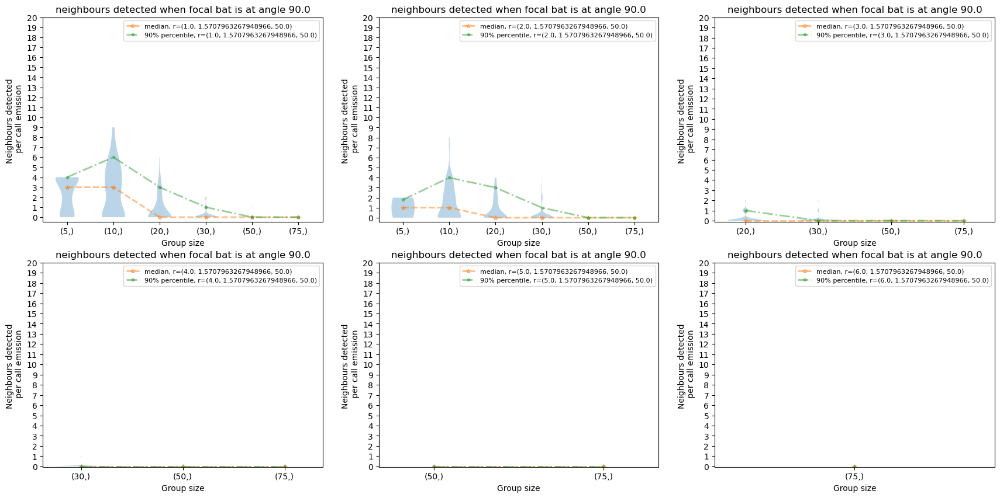

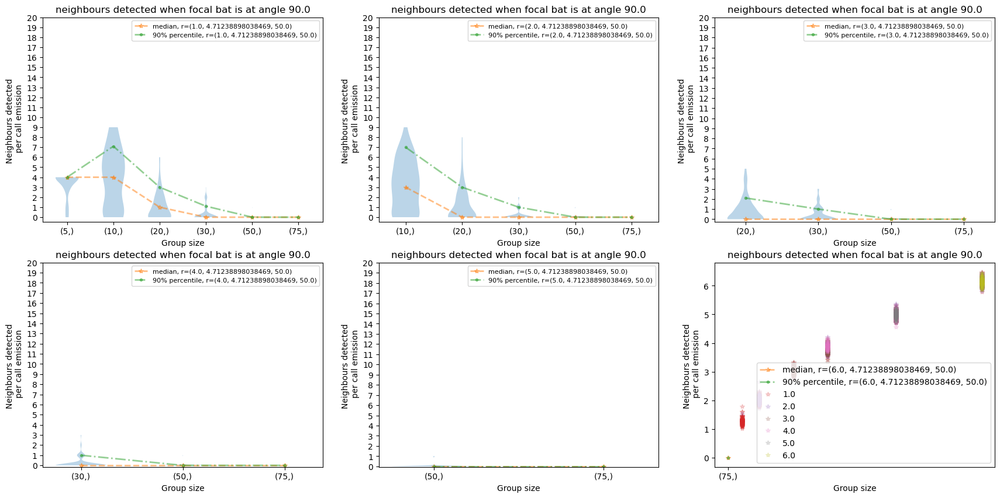

4.71238898038469


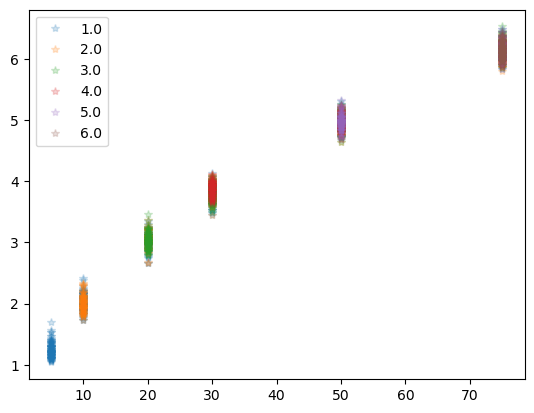

swarming
[['1.0' '1.5707963267948966' 'swarming']
 ['1.0' '4.71238898038469' 'swarming']
 ['2.0' '1.5707963267948966' 'swarming']
 ['2.0' '4.71238898038469' 'swarming']
 ['3.0' '1.5707963267948966' 'swarming']
 ['3.0' '4.71238898038469' 'swarming']
 ['4.0' '1.5707963267948966' 'swarming']
 ['4.0' '4.71238898038469' 'swarming']
 ['5.0' '1.5707963267948966' 'swarming']
 ['5.0' '4.71238898038469' 'swarming']
 ['6.0' '1.5707963267948966' 'swarming']
 ['6.0' '4.71238898038469' 'swarming']]
['1.5707963267948966' '4.71238898038469']
0
2
4
6
8
10
1
3
5
7
9
11
1.5707963267948966


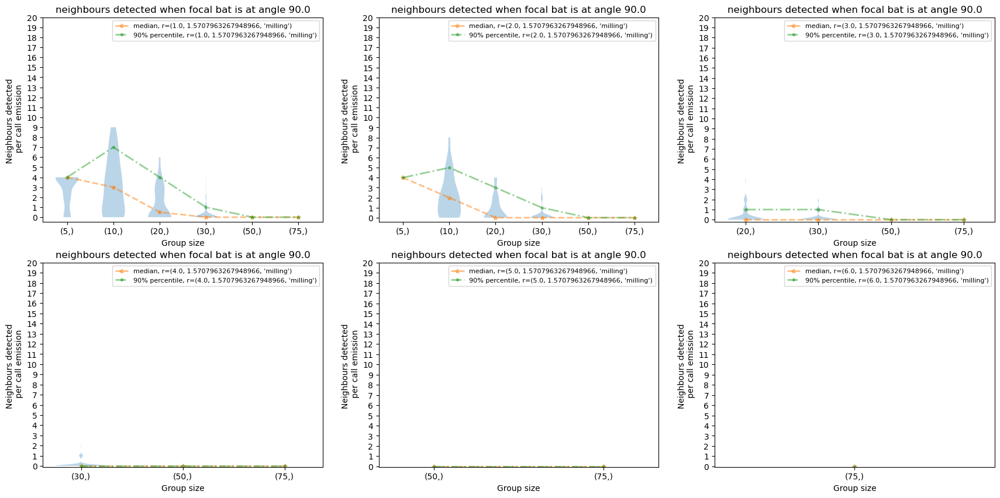

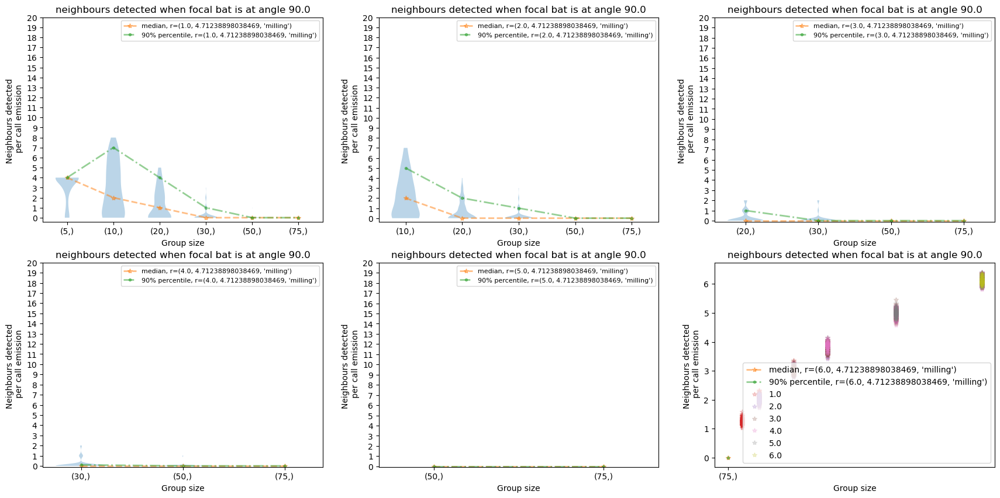

4.71238898038469


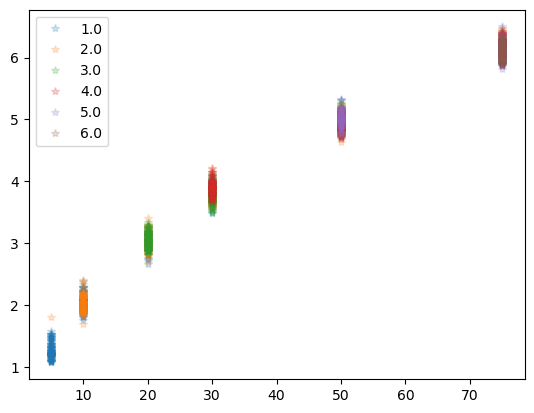

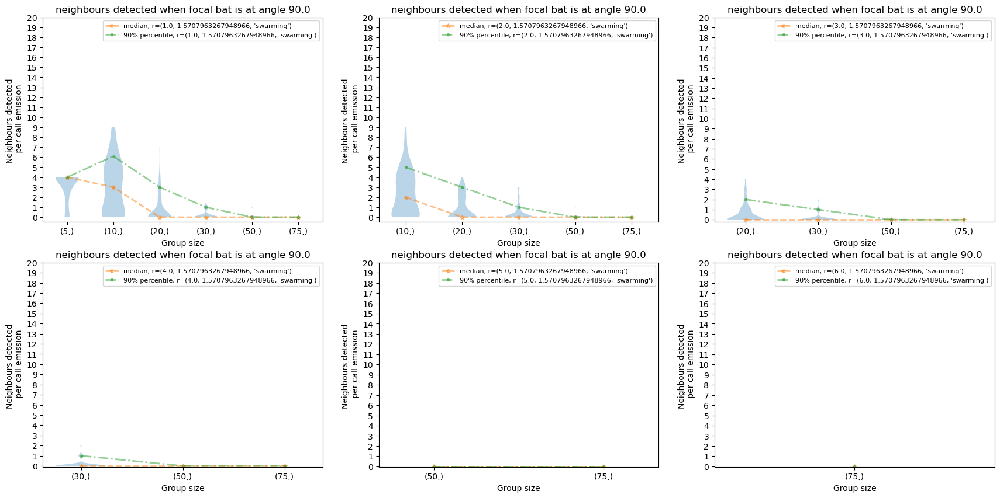

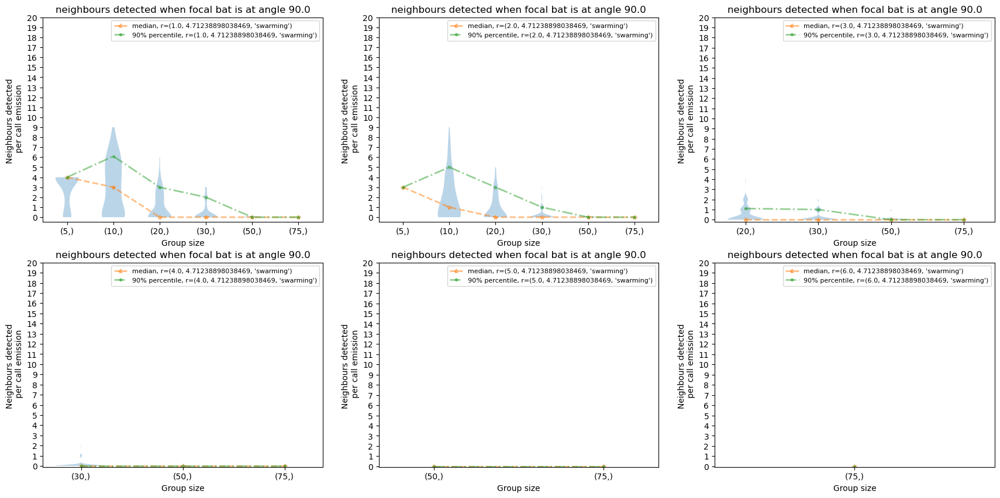

In [19]:
store_info_cleaned= {}
subset= [0,10,30,50, "milling", "swarming"]
for key in subset:
    print(key)
    array_containing_all_simulation_datasets_raw= store_info[key]
    array_containing_all_simulation_datasets=[]
    array_containing_labels= []
    for simulation_data in array_containing_all_simulation_datasets_raw:
        try:
            if simulation_data["focal_bat"][0][2]==key:
                array_containing_all_simulation_datasets.append(simulation_data)
                array_containing_labels.append(simulation_data["focal_bat"][0])
        except KeyError:
            continue
    store_info_cleaned[key]= array_containing_all_simulation_datasets
    array_containing_labels= np.array(array_containing_labels)

    print(array_containing_labels)

    unique_angles_in_dataset= np.unique(array_containing_labels[:,1])
    list_containing_simulated_data_sorted_by_angles= {}
    print(unique_angles_in_dataset)
    for angle in unique_angles_in_dataset:
        list_containing_simulated_data_sorted_by_angles[angle]= []
        sublist_true_false_labels= array_containing_labels[:,1]==angle
        sublist_given_angle= passing_true_false_indices_through_lists(array_containing_all_simulation_datasets, sublist_true_false_labels)
        list_containing_simulated_data_sorted_by_angles[angle].append(sublist_given_angle)
    %matplotlib inline
    i=0
    for angle in list_containing_simulated_data_sorted_by_angles.keys():
        subset_given_angle= list_containing_simulated_data_sorted_by_angles[angle][0]
        print(angle)
        for simulation_data in subset_given_angle:
            plt.plot(simulation_data['group_size'],
                        simulation_data['group_diameter'], 
                    '*',label=simulation_data["focal_bat"][0][0],alpha=0.2)
            i+=1
        plt.legend()
        plt.show()
    iterant1_axis=0
    # fig, axs = plt.subplots(1,3, figsize=(27,9))


    for angle in list_containing_simulated_data_sorted_by_angles.keys():
            subset_given_angle= list_containing_simulated_data_sorted_by_angles[angle][0]; iterant2_color=0
            colors=["blue", "red", "green", "black"]
            plt.figure(figsize=(21,10))
            i=1
            for simulation_data in subset_given_angle:
                    data_by_groupsize = simulation_data.groupby(['group_size'])
                    nbrs_detected_data = {}
                    nbrs_detected_data['num_nbrs'] = []
                    nbrs_detected_data['median_num_nbrs'] = []
                    nbrs_detected_data['90%ile_num_nbrs'] = []
                    groupsizes= []
                    for groupsize, dataframe in data_by_groupsize:
                            groupsizes.append(groupsize)
                            nbrs_detected_data['num_nbrs'].append(np.array(dataframe['nbrs_detected']))
                            nbrs_detected_data['median_num_nbrs'].append(np.median(np.array(dataframe['nbrs_detected'])))
                            nbrs_detected_data['90%ile_num_nbrs'].append(np.percentile(np.array(dataframe['nbrs_detected']), 90))

                    breakup_x_axis  = np.arange(1,len(groupsizes)+1)+0.5
                    nbrs_detected_data['median_num_nbrs']

                    # plt.figure(figsize=(7,3.42))
                    plt.subplot(2,3,i)
                    plt.violinplot(nbrs_detected_data['num_nbrs'][:], showextrema=False)
                    plt.plot(np.arange(1,len(groupsizes)+1),nbrs_detected_data['median_num_nbrs'][:],
                            '--*',linewidth=2, alpha=0.5,label="median, r="+str(simulation_data["focal_bat"][0]))#'median')
                    # print(np.arange(1,len(groupsizes)))
                    plt.plot(np.arange(1,len(groupsizes)+1), nbrs_detected_data['90%ile_num_nbrs'][:],
                            '-..',linewidth=2, alpha=0.5, label="90% percentile, r="+str(simulation_data["focal_bat"][0]))#label='90%ile')
                    # plt.vlines(breakup_x_axis, -1,20, 'w',linewidth=30,alpha=1.0)
                    plt.yticks(np.arange(0,21,1))
                    plt.xticks(range(1,len(groupsizes)+1),groupsizes[:])
                    plt.legend(fontsize=8)
                    plt.ylabel('Neighbours detected \n per call emission', fontsize=10)
                    plt.xlabel('Group size', fontsize=10)
                    # # plt.ylim(0,20)

                    # axs[i].tight_layout()
                    plt.title("neighbours detected when focal bat is at angle "+str(np.degrees(np.pi/2)))
                    iterant2_color+=1; i+=1
                    
            iterant1_axis+=1
                    # plt.savefig('Figure2_groupsize_1200dpi.pdf',
                    #         bbox_inches='tight', pad_inches=0.05, format='pdf', dpi=1200)
            
            # print(groupsizes); print(nbrs_detected_data['median_num_nbrs'])

# Verticle transect

moving from $(0.75, \frac {3pi}{2})$ to $(0.75, \frac {pi}{2})$ [r, theta] is similar to moving in a ($x=0$) transect centered at the centermost bat.
Note: All the heading vectors are in 90 degree direction ( $\pm$ 10 degree)

In [ ]:
tuple([1,1,1])

(1, 1, 1)

In [25]:
key= "swarming"
transect_subsets= [[6.0, 3*np.pi/2, key],[5.0, 3*np.pi/2, key],[4.0, 3*np.pi/2, key],[3.0, 3*np.pi/2, key],[2.0, 3*np.pi/2, key],[1.0, 3*np.pi/2, key],[1.0, np.pi/2, key],[2.0, np.pi/2, key], [3.0, np.pi/2, key], [4.0, np.pi/2, key], [5.0, np.pi/2, key], [6.0, np.pi/2, key]]
transect_subsets= [tuple(i) for i in transect_subsets]
iterant_transect=0
sublist_of_simulation_data_intransect=[]
for r_theta in transect_subsets:
    for simulation_data in array_containing_all_simulation_datasets:
        if simulation_data["focal_bat"][0]==r_theta:
            sublist_of_simulation_data_intransect.append(simulation_data)    

sign_based_on_distance_from_centermost_point= [-1, -1, -1, -1, -1, -1, 1, 1, 1, 1, 1, 1]     
group_sizes= [5,10,20,30,50,75]

In [26]:
sublist_of_simulation_data_intransect_across_heading_var= {}

for heading_var in group_heading_variation:
    sublist_of_simulation_data_intransect=[]
    array_containing_all_simulation_datasets= store_info_cleaned[heading_var]
    key= heading_var
    transect_subsets= [[6.0, 3*np.pi/2, key],[5.0, 3*np.pi/2, key],[4.0, 3*np.pi/2, key],[3.0, 3*np.pi/2, key],[2.0, 3*np.pi/2, key],[1.0, 3*np.pi/2, key],[1.0, np.pi/2, key],[2.0, np.pi/2, key], [3.0, np.pi/2, key], [4.0, np.pi/2, key], [5.0, np.pi/2, key], [6.0, np.pi/2, key]]
    transect_subsets= [tuple(i) for i in transect_subsets]

    for r_theta in transect_subsets:
        for simulation_data in array_containing_all_simulation_datasets:
            if simulation_data["focal_bat"][0]==r_theta:
                sublist_of_simulation_data_intransect.append(simulation_data)    
    sublist_of_simulation_data_intransect_across_heading_var[heading_var]= sublist_of_simulation_data_intransect

In [ ]:
sublist_of_simulation_data_intransect_across_heading_var[10]

[    nbrs_detected  group_size  group_diameter  \
 0               2          75        6.006471   
 1               1          75        6.151556   
 2               1          75        6.006108   
 3               1          75        6.212422   
 4               3          75        6.214739   
 ..            ...         ...             ...   
 95              2          75        6.059763   
 96              1          75        6.202057   
 97              0          75        6.188664   
 98              1          75        6.335666   
 99              2          75        6.119356   
 
                            nearest_neighbour_distance  \
 0   [0.5490648763811092, 0.6913576503403807, 0.739...   
 1   [0.6025770331279539, 0.7593579885085383, 0.771...   
 2   [0.6830701272679425, 0.7713317881488884, 0.773...   
 3   [0.5625949477821244, 0.5856992595628759, 0.616...   
 4   [0.5246475058045458, 0.5447650319281616, 0.826...   
 ..                                               

In [ ]:
len(sublist_of_simulation_data_intransect)

12

In [ ]:
array_containing_all_simulation_datasets[1]["focal_bat"][0]==[1.0, 3*np.pi/2, key]
float(simulation_data["focal_bat"][0][1])

4.71238898038469

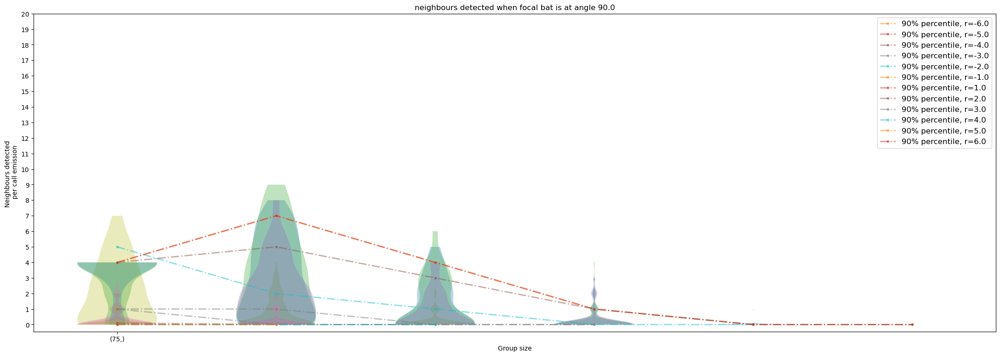

In [27]:
colors=["blue", "red", "green", "black", "pink", "cyan", "yellow"]

fig, axs = plt.subplots(1,1, figsize=(27,9))
iterant2_color=0
for simulation_data in sublist_of_simulation_data_intransect:
        data_by_groupsize = simulation_data.groupby(['group_size'])
        nbrs_detected_data = {}
        nbrs_detected_data['num_nbrs'] = []
        nbrs_detected_data['median_num_nbrs'] = []
        nbrs_detected_data['90%ile_num_nbrs'] = []
        groupsizes= []
        for groupsize, dataframe in data_by_groupsize:
                groupsizes.append(groupsize)
                nbrs_detected_data['num_nbrs'].append(np.array(dataframe['nbrs_detected']))
                nbrs_detected_data['median_num_nbrs'].append(np.median(np.array(dataframe['nbrs_detected'])))
                nbrs_detected_data['90%ile_num_nbrs'].append(np.percentile(np.array(dataframe['nbrs_detected']), 90))

        breakup_x_axis  = np.arange(1,len(groupsizes)+1)+0.5
        nbrs_detected_data['median_num_nbrs']

        # plt.figure(figsize=(7,3.42))
        # plt.subplot(1,2,i)
        
        axs.violinplot(nbrs_detected_data['num_nbrs'][:], showextrema=False)
        # axs.plot(np.arange(1,len(groupsizes)+1),nbrs_detected_data['median_num_nbrs'][:],
        #         '--*',linewidth=2, alpha=0.5,label="median, r="+str(sign_based_on_distance_from_centermost_point[iterant2_color]*simulation_data["focal_bat"][0][0]), 
        #         color= colors[iterant2_color])#'median')
        # print(np.arange(1,len(groupsizes)))
        axs.plot(np.arange(1,len(groupsizes)+1), nbrs_detected_data['90%ile_num_nbrs'][:],
                '-..',linewidth=2, alpha=0.5, label="90% percentile, r="+str(sign_based_on_distance_from_centermost_point[iterant2_color]*simulation_data["focal_bat"][0][0])
                )#label='90%ile')
        # plt.vlines(breakup_x_axis, -1,20, 'w',linewidth=30,alpha=1.0)
        axs.set_yticks(np.arange(0,21,1))
        axs.set_xticks(range(1,len(groupsizes)+1),groupsizes[:])
        axs.legend(fontsize=12)
        axs.set_ylabel('Neighbours detected \n per call emission', fontsize=10)
        axs.set_xlabel('Group size', fontsize=10)
        # # plt.ylim(0,20)

        # axs[i].tight_layout()
        axs.set_title("neighbours detected when focal bat is at angle "+str(np.degrees(float(simulation_data["focal_bat"][0][1]))))
        iterant2_color+=1
plt.show()

separate the violin plots out for different group sizes to see clear differences between distance from center


/tmp/ipykernel_244814/2569770723.py:19: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_244814/2569770723.py:19: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_244814/2569770723.py:19: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_244814/2569770723.py:19: FutureWarning: When g

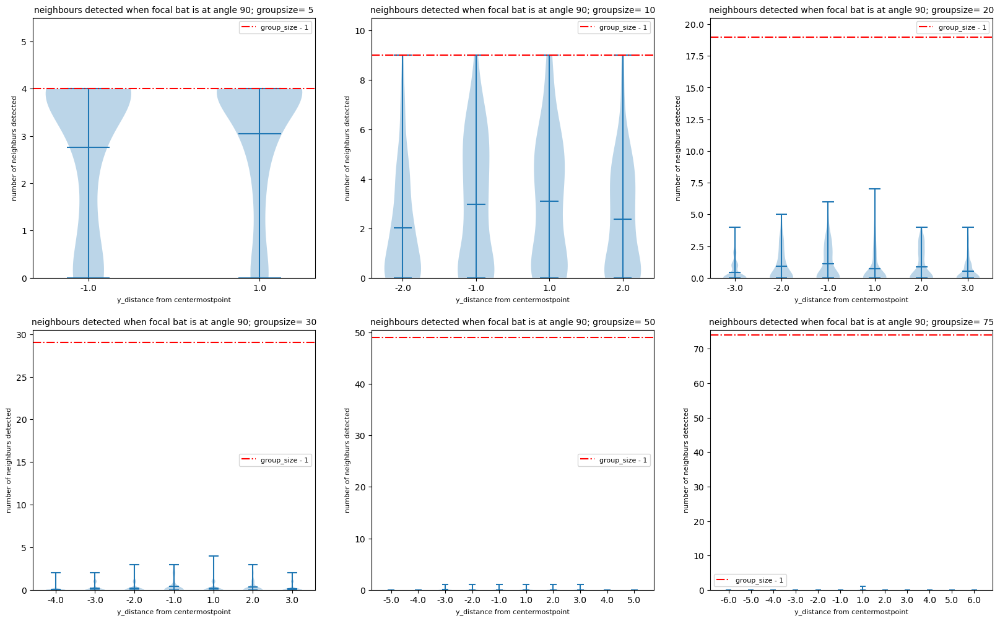

In [28]:
colors=["blue", "red", "green", "black", "pink", "cyan", "yellow"]

# fig, axs = plt.subplots(1,1, figsize=(27,9))
i=0; 
number_of_columns=3; number_of_rows= int(np.ceil(len(group_sizes)/number_of_columns))
plt.figure(figsize=(20,12))
sublist_of_simulation_data_intransect= sublist_of_simulation_data_intransect_across_heading_var["swarming"]
for group_size in group_sizes:
    nbrs_detected_data = {}
    nbrs_detected_data['num_nbrs'] = []
    nbrs_detected_data['median_num_nbrs'] = []
    nbrs_detected_data['90%ile_num_nbrs'] = []
    
    x_ticks= []; iterant_sign=-1
    for simulation_data in sublist_of_simulation_data_intransect:
        iterant_sign+=1

        try:
            dataframe = simulation_data.groupby(['group_size']).get_group(group_size)    
            if len(dataframe["nbrs_detected"])!=100:
                continue
            nbrs_detected_data['num_nbrs'].append(np.array(dataframe['nbrs_detected']))
            nbrs_detected_data['median_num_nbrs'].append(np.median(np.array(dataframe['nbrs_detected'])))
            nbrs_detected_data['90%ile_num_nbrs'].append(np.percentile(np.array(dataframe['nbrs_detected']), 90))    
        except KeyError:
            continue
        x_ticks.append(sign_based_on_distance_from_centermost_point[iterant_sign]*simulation_data["focal_bat"][0][0])
    

    plt.subplot(number_of_rows,number_of_columns,i+1)
    plt.violinplot(nbrs_detected_data['num_nbrs'], showmeans=True)
    # plt.boxplot(nbrs_detected_data['num_nbrs'], showmeans=True)
    plt.title(f"neighbours detected when focal bat is at angle {90}; groupsize= {group_size}", fontsize= "10")
    plt.xticks(np.arange(1,len(x_ticks)+1),x_ticks)
    # plt.show()
    plt.ylim(0,group_size+0.5)
    plt.axhline(group_size-1, ls="-.", color="red", label= "group_size - 1")
    plt.xlabel("y_distance from centermostpoint", fontsize= "8")
    plt.ylabel("number of neighburs detected", fontsize= "8")
    plt.legend(fontsize= "8")

    i+=1

Zooming into the plots to see finer differences between the diffrent violin plots

/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When g

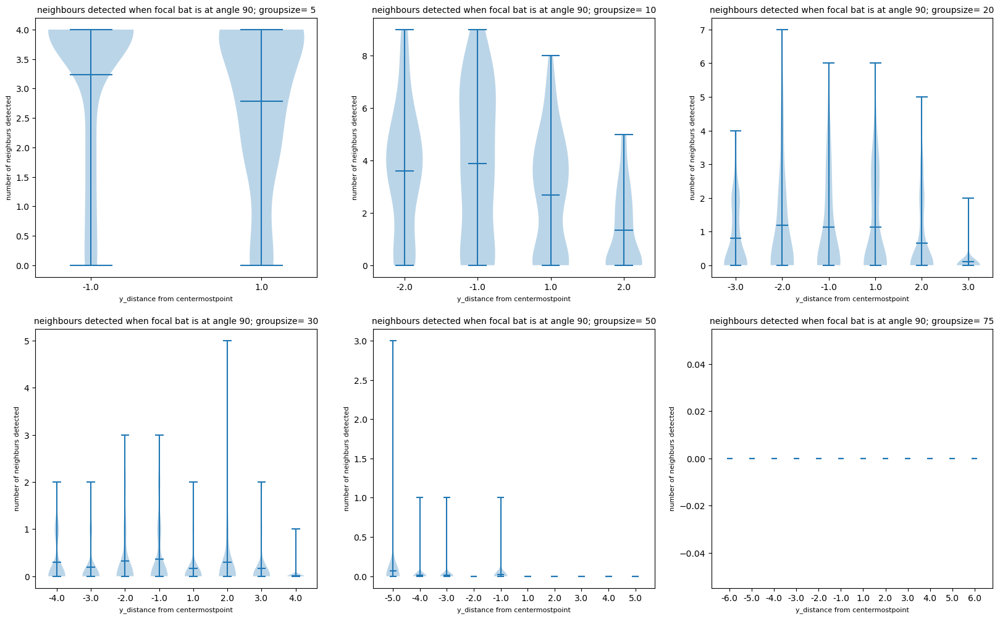

/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When g

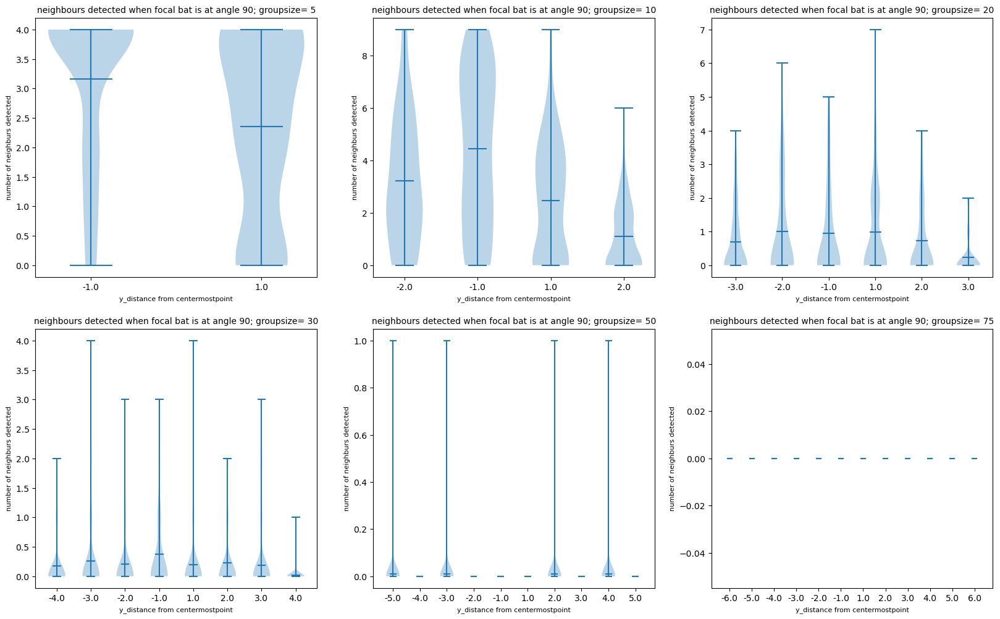

/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When g

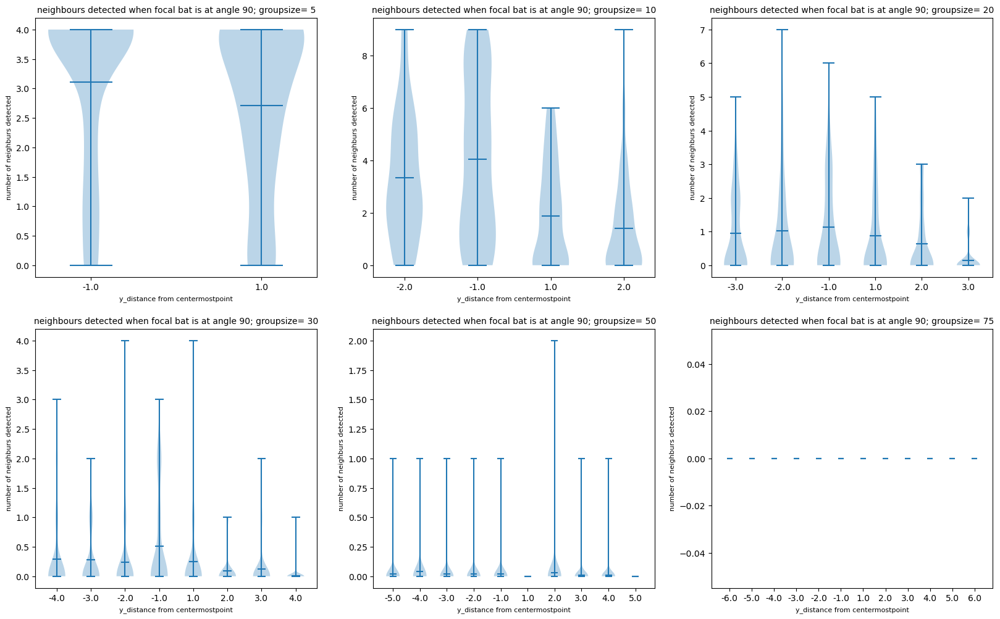

/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When g

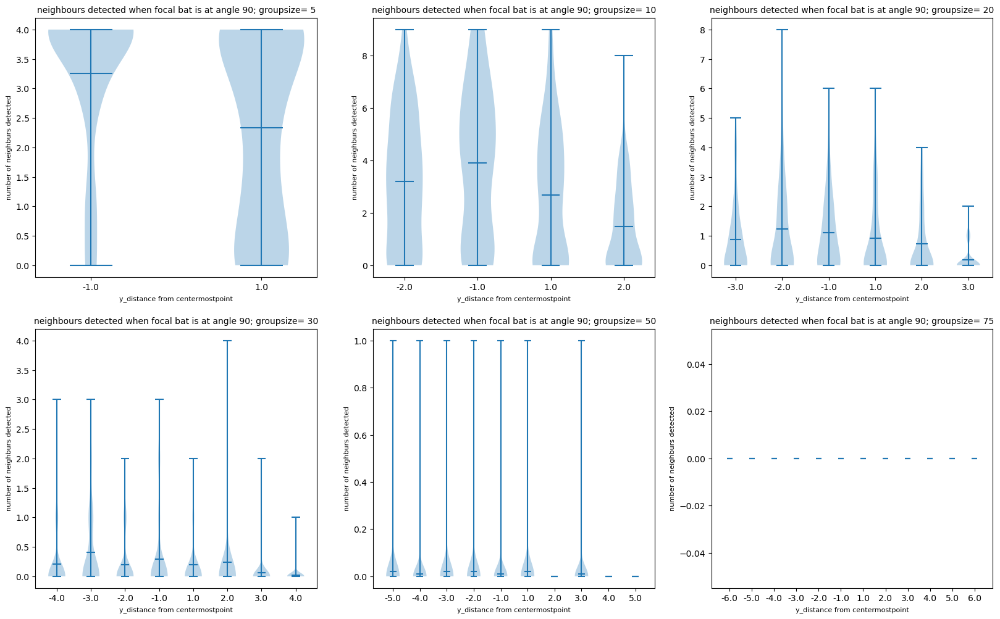

/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When g

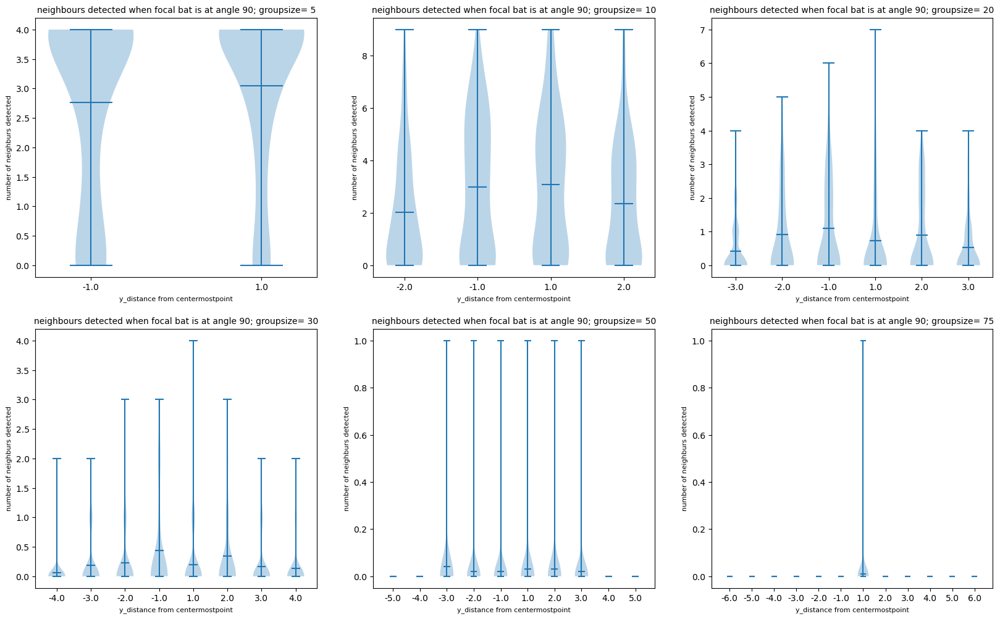

/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  dataframe = simulation_data.groupby(['group_size']).get_group(group_size)
/tmp/ipykernel_244814/3077652713.py:24: FutureWarning: When g

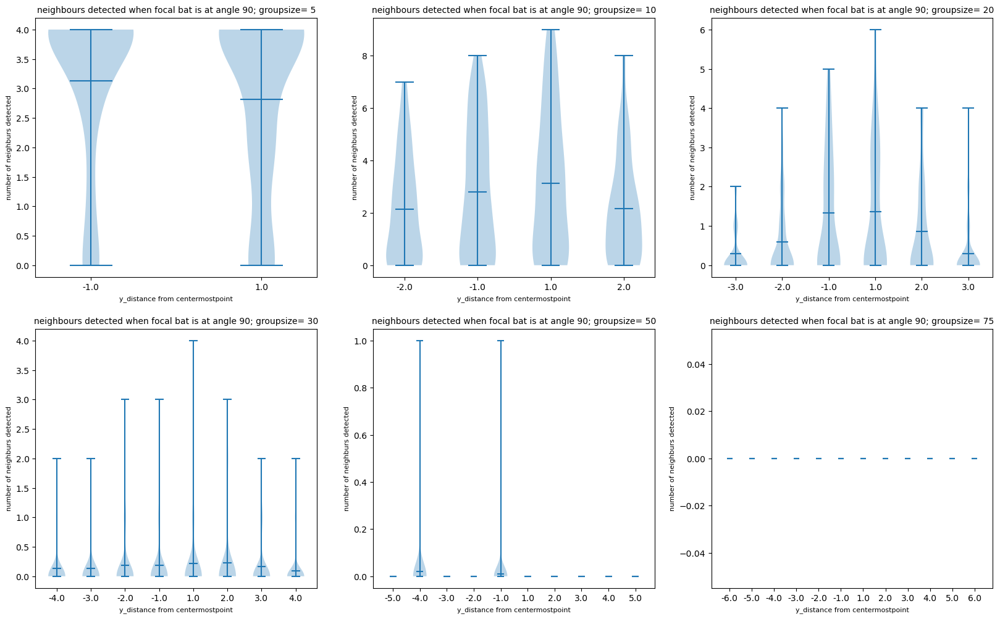

In [38]:
colors=["blue", "red", "green", "black", "pink", "cyan", "yellow"]

# fig, axs = plt.subplots(1,1, figsize=(27,9))
i=0; 
number_of_columns=3; number_of_rows= int(np.ceil(len(group_sizes)/number_of_columns))

store_nbrs_across_heading_var= {} #key is heading var
for heading_var in group_heading_variation:
        store_probability_of_detection_n_neighbour= {}
        group_sizes= [5,10,20,30,50,75]
        i=0
        sublist_of_simulation_data_intransect= sublist_of_simulation_data_intransect_across_heading_var[heading_var]
        plt.figure(figsize=(20,12))
        for group_size in group_sizes:
            nbrs_detected_data = {}
            nbrs_detected_data['num_nbrs'] = []
            nbrs_detected_data['median_num_nbrs'] = []
            nbrs_detected_data['90%ile_num_nbrs'] = []
            
            x_ticks= []; iterant_sign=-1
            for simulation_data in sublist_of_simulation_data_intransect:
                iterant_sign+=1
                try:
                    dataframe = simulation_data.groupby(['group_size']).get_group(group_size)    
                    if len(dataframe["nbrs_detected"])<90:
                        continue
                    nbrs_detected_data['num_nbrs'].append(np.array(dataframe['nbrs_detected']))
                    nbrs_detected_data['median_num_nbrs'].append(np.median(np.array(dataframe['nbrs_detected'])))
                    nbrs_detected_data['90%ile_num_nbrs'].append(np.percentile(np.array(dataframe['nbrs_detected']), 90))    
                except KeyError:
                    continue
                x_ticks.append(sign_based_on_distance_from_centermost_point[iterant_sign]*simulation_data["focal_bat"][0][0])

                

            plt.subplot(number_of_rows,number_of_columns,i+1)
            plt.violinplot(nbrs_detected_data['num_nbrs'], showmeans=True)
            # plt.boxplot(nbrs_detected_data['num_nbrs'], showmeans=True)
            plt.title(f"neighbours detected when focal bat is at angle {90}; groupsize= {group_size}", fontsize= "10")
            plt.xticks(np.arange(1,len(x_ticks)+1),x_ticks)
            # plt.show()
            # plt.ylim(0,group_size+0.5)
            # plt.axhline(group_size-1, ls="-.", color="red", label= "group_size - 1")
            plt.xlabel("y_distance from centermostpoint", fontsize= "8")
            plt.ylabel("number of neighburs detected", fontsize= "8")
            # plt.legend(fontsize= "8")

            i+=1
        plt.show()

The number of neighbours detected shows an increase with group size initially and then drops sharply down beyond 30 bats. 


### How does the probability of detecting at least one neighbour change with group size?

In [30]:
def calculate_geqNneighbour(num_detected_neighbours, N):
    '''Calculates the proportion of an array-like
    object that is >= N.
    
    '''
    geq_N = np.float64(np.sum(num_detected_neighbours>=N))
    if np.isnan(np.min(num_detected_neighbours)):
        return np.nan
    proportion_geq_N = geq_N/len(num_detected_neighbours)
    return(proportion_geq_N)

In [39]:
np.sum([])

np.float64(0.0)

In [ ]:
simulation_data.keys()

Index(['nbrs_detected', 'group_size', 'group_diameter',
       'nearest_neighbour_distance', 'nbrs_detected_distance', 'uuid', 'seed',
       'paramset_id', 'parameters_joint', 'echo_levels', 'detection_azimuth',
       'heading_variation', 'echocall_duration', 'atmospheric_attenuation',
       'min_spacing', 'source_level', 'interpulse_interval',
       'implement_shadowing', 'focal_bat'],
      dtype='object')

In [46]:
#store data
store_nbrs_across_heading_var= {} #key is heading var
for heading_var in group_heading_variation:
        store_probability_of_detection_n_neighbour= {}
        group_sizes= [5,10,20,30,50,75]
        i=0
        sublist_of_simulation_data_intransect= sublist_of_simulation_data_intransect_across_heading_var[heading_var]
        for simulation_data in sublist_of_simulation_data_intransect:
                data_by_groupsize = simulation_data.groupby(['group_size'])

                nbrs_detected_data = {}
                nbrs_detected_data["group_sizes"]= group_sizes
                nbrs_detected_data['num_nbrs'] = []
                nbrs_detected_data['median_num_nbrs'] = []
                nbrs_detected_data['90%ile_num_nbrs'] = []
                nbrs_detected_data['detected_distances'] = []
                nbrs_detected_data['neighbours_azimuth'] = []
                nbrs_detected_data['echolevels'] = []
                groupsizes= []

                for groupsize, dataframe in data_by_groupsize:
                        if len(dataframe)<95:
                                print(len(dataframe))
                                continue
                        groupsizes.append(groupsize[0])
                        nbrs_detected_data['num_nbrs'].append(np.array(dataframe['nbrs_detected']))
                        nbrs_detected_data['median_num_nbrs'].append(np.median(np.array(dataframe['nbrs_detected'])))
                        nbrs_detected_data['90%ile_num_nbrs'].append(np.percentile(np.array(dataframe['nbrs_detected']), 90))

                        nbrs_detected_data['detected_distances'].append(np.concatenate(np.array(dataframe['nbrs_detected_distance'])))

                        nbrs_detected_data['neighbours_azimuth'].append(np.concatenate(np.array(dataframe['detection_azimuth'])))

                        nbrs_detected_data['echolevels'].append(np.concatenate(np.array(dataframe['echo_levels'])))

                nan_groupsizes= [i for i in group_sizes if i not in groupsizes]

                for nan_groupsize in nan_groupsizes:
                        nbrs_detected_data['num_nbrs']= [np.nan, *nbrs_detected_data['num_nbrs']]
                        nbrs_detected_data['median_num_nbrs']= [np.nan, *nbrs_detected_data['median_num_nbrs']]
                        nbrs_detected_data['90%ile_num_nbrs']= [np.nan, *nbrs_detected_data['90%ile_num_nbrs']]

                nbrs_detected_data['0neighbours'] = [ 1-calculate_geqNneighbour(each,1)  for each in nbrs_detected_data['num_nbrs']]
                nbrs_detected_data['geq_1neighbour'] = [ calculate_geqNneighbour(each,1)  for each in nbrs_detected_data['num_nbrs']]
                nbrs_detected_data['geq_2neighbour'] = [ calculate_geqNneighbour(each,2)  for each in nbrs_detected_data['num_nbrs']]
                nbrs_detected_data['geq_3neighbour'] = [ calculate_geqNneighbour(each,3)  for each in nbrs_detected_data['num_nbrs']]
                nbrs_detected_data['geq_4neighbour'] = [ calculate_geqNneighbour(each,4)  for each in nbrs_detected_data['num_nbrs']]

                # nbrs_detected_data['detected_distances'] = [ np.concatenate(np.array(dataframe['nbrs_detected_distance'])) for groupsize, dataframe in data_by_groupsize]
                # nbrs_detected_data['median_detected_distances'] = map(np.median, nbrs_detected_data['detected_distances'])
                # nbrs_detected_data['90%ile_detected_distances'] = map(lambda X : np.percentile(X,90),
                #                                                 nbrs_detected_data['detected_distances'][:-1])

                # nbrs_detected_data['neighbours_azimuth'] = [ np.concatenate(np.array(dataframe['detection_azimuth'])) for groupsize, dataframe in data_by_groupsize]
                # nbrs_detected_data['median_neighbours_azimuth'] = [ np.median(each)  for each in nbrs_detected_data['neighbours_azimuth'] ]
                # nbrs_detected_data['95%ile_neighbours_azimuth'] = [ np.percentile(each, 97.5)  for each in nbrs_detected_data['neighbours_azimuth'][:-1] ]
                # nbrs_detected_data['5%ile_neighbours_azimuth'] = [ np.percentile(each, 2.5)  for each in nbrs_detected_data['neighbours_azimuth'][:-1] ]

                # # nbrs_detected_data['echolevels'] = [ np.concatenate(np.array(dataframe['echo_levels'])) for groupsize, dataframe in data_by_groupsize]
                # nbrs_detected_data['median_echolevels'] = [ np.median(each) for each in nbrs_detected_data['echolevels']]
                # nbrs_detected_data['5%ile_echolevels'] = [ np.percentile(each, 2.5) for each in nbrs_detected_data['echolevels'][:-1]]
                # nbrs_detected_data['95%ile_echolevels'] = [ np.percentile(each, 97.5) for each in nbrs_detected_data['echolevels'][:-1]]

                for nan_groupsize in nan_groupsizes:
                        # nbrs_detected_data['detected_distances']= [np.nan, *nbrs_detected_data['detected_distances']]
                        # nbrs_detected_data['median_detected_distances']= [np.nan, *nbrs_detected_data['median_detected_distances']]
                        # nbrs_detected_data['90%ile_detected_distances']= [np.nan, *nbrs_detected_data['90%ile_detected_distances']]

                        nbrs_detected_data['neighbours_azimuth']= [[np.nan], *nbrs_detected_data['neighbours_azimuth']]
                        # nbrs_detected_data['median_neighbours_azimuth']= [np.nan, *nbrs_detected_data['median_neighbours_azimuth']]
                        # nbrs_detected_data['5%ile_neighbours_azimuth']= [np.nan, *nbrs_detected_data['5%ile_neighbours_azimuth']]
                        # nbrs_detected_data['95%ile_neighbours_azimuth']= [np.nan, *nbrs_detected_data['95%ile_neighbours_azimuth']]

                        nbrs_detected_data['echolevels']= [[np.nan], *nbrs_detected_data['echolevels']]
                        # nbrs_detected_data['median_echolevels']= [np.nan, *nbrs_detected_data['median_echolevels']]
                        # nbrs_detected_data['5%ile_echolevels']= [np.nan, *nbrs_detected_data['5%ile_echolevels']]
                        # nbrs_detected_data['95%ile_echolevels']= [np.nan, *nbrs_detected_data['95%ile_echolevels']]
                        
                
                store_probability_of_detection_n_neighbour[simulation_data["focal_bat"][0][0]*sign_based_on_distance_from_centermost_point[i]]= nbrs_detected_data
                i+=1
        store_nbrs_across_heading_var[heading_var]= store_probability_of_detection_n_neighbour

2
3
1
2
1
1


In [ ]:
store_nbrs_across_heading_var["milling"]

{-6.0: {'group_sizes': [5, 10, 20, 30, 50, 75],
  'num_nbrs': [nan,
   nan,
   nan,
   nan,
   nan,
   array([0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1,
          1, 1, 1, 1, 0, 2, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0,
          1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1,
          0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1,
          1, 0, 0, 0, 0, 0, 0, 2, 1, 0, 1, 1])],
  'median_num_nbrs': [nan, nan, nan, nan, nan, np.float64(0.0)],
  '90%ile_num_nbrs': [nan, nan, nan, nan, nan, np.float64(1.0)],
  'detected_distances': [nan,
   nan,
   nan,
   nan,
   nan,
   array([0.63578546, 0.58518082, 0.58579685, 0.56047984, 0.73994231,
          0.65997563, 0.51996969, 0.60185078, 0.63794003, 0.67724586,
          0.55671536, 0.50376095, 0.64055851, 0.53702641, 0.5084076 ,
          0.58864802, 0.53480981, 0.78011995, 0.50242064, 0.70694527,
          0.58776315, 0.5028513 , 0.52118863, 0.63319586, 0.52074359,
     

In [ ]:
store_nbrs_across_heading_var["swarming"]

{-6.0: {'group_sizes': [5, 10, 20, 30, 50, 75],
  'num_nbrs': [nan,
   nan,
   nan,
   nan,
   nan,
   array([0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1,
          0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1,
          1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 2, 0, 1, 1, 0,
          0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0,
          0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0])],
  'median_num_nbrs': [nan, nan, nan, nan, nan, np.float64(0.0)],
  '90%ile_num_nbrs': [nan, nan, nan, nan, nan, np.float64(1.0)],
  'detected_distances': [nan,
   nan,
   nan,
   nan,
   nan,
   array([0.50771068, 0.90115966, 0.54076344, 0.5473137 , 0.61949485,
          0.71394918, 0.58515067, 0.94623025, 0.50219351, 0.57017459,
          0.60080011, 0.60900886, 0.57705657, 0.62694038, 0.68525329,
          0.62315059, 0.50106944, 0.53003374, 0.55630798, 0.53585435,
          0.52740476, 0.59268599, 0.54281062, 0.75211819, 0.50943213,
     

In [ ]:
heading_var= "milling"

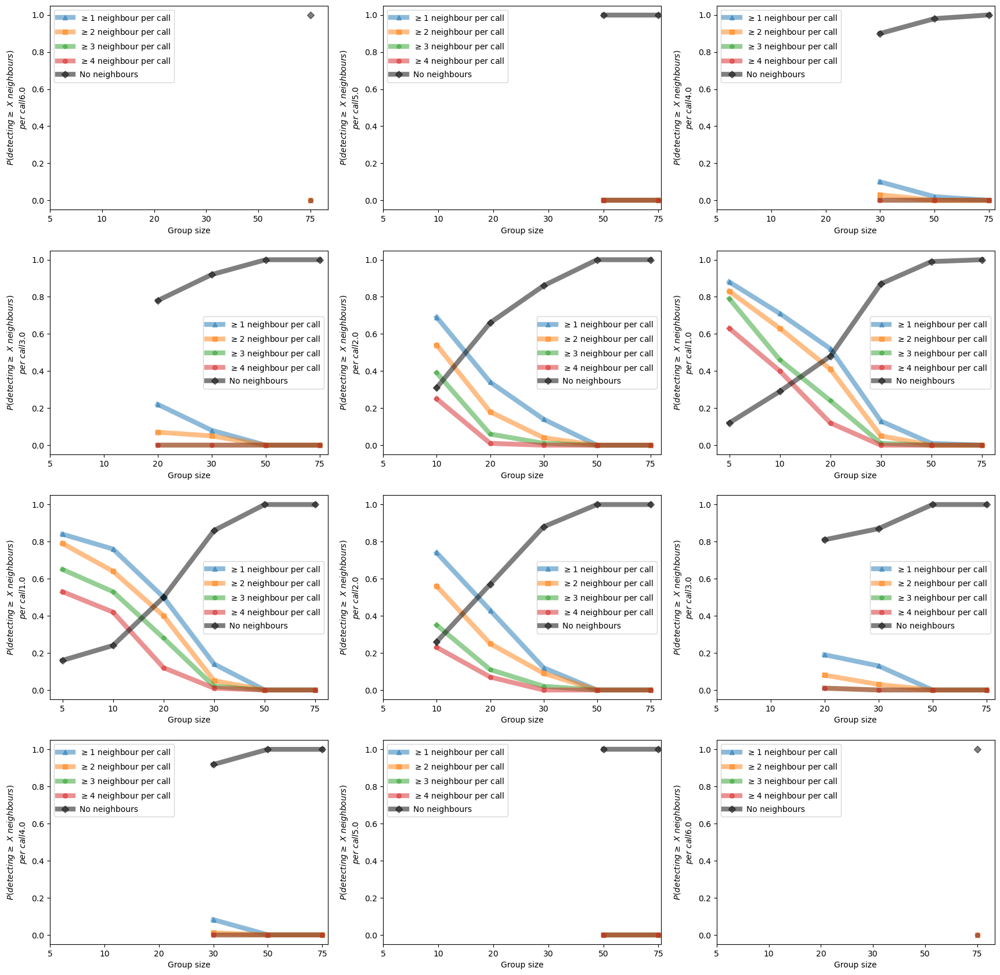

In [43]:
store_probability_of_detection_n_neighbour= store_nbrs_across_heading_var[heading_var]
i=0; 
number_of_columns=3; number_of_rows= int(np.ceil(len(sublist_of_simulation_data_intransect)/number_of_columns))
plt.figure(figsize= (21,21))
for simulation_data in sublist_of_simulation_data_intransect:
        data_by_groupsize = simulation_data.groupby(['group_size'])
        groupsizes= group_sizes

        key_for_dict= simulation_data["focal_bat"][0][0]*sign_based_on_distance_from_centermost_point[i]
        nbrs_detected_data= store_probability_of_detection_n_neighbour[key_for_dict]

        plt.subplot(number_of_rows,number_of_columns,i+1)
        plt.plot(np.arange(1,len(groupsizes)+1), 
                nbrs_detected_data['geq_1neighbour'], '-^', linewidth=6, alpha=0.5, label='$\geq1$ neighbour per call')
        plt.plot(np.arange(1,len(groupsizes)+1), 
                nbrs_detected_data['geq_2neighbour'], '-s', linewidth=6, alpha=0.5, label='$\geq2$ neighbour per call')
        plt.plot(np.arange(1,len(groupsizes)+1), 
                nbrs_detected_data['geq_3neighbour'], '-p', linewidth=6, alpha=0.5, label='$\geq3$ neighbour per call')
        plt.plot(np.arange(1,len(groupsizes)+1), 
                nbrs_detected_data['geq_4neighbour'], '-H', linewidth=6, alpha=0.5, label='$\geq4$ neighbour per call')
        plt.plot(np.arange(1,len(groupsizes)+1), 
                nbrs_detected_data['0neighbours'], '-Dk', linewidth=6, alpha=0.5, label='No neighbours')

        plt.yticks(fontsize=10)
        plt.xticks(np.arange(1,len(groupsizes)+1),
                groupsizes,fontsize=10)
        plt.legend()
        plt.ylabel('$P(detecting \geq \ X \ neighbours)$'+'\n'+ '$per \ call$'+str(simulation_data["focal_bat"][0][0]),
                fontsize=10)
        plt.xlabel('Group size',
                fontsize=10)
        plt.ylim(-0.05,1.05)
        
        i+=1

In [47]:
print(group_heading_variation)
j=0
plt.figure(figsize= (100,100))
for heading_var in group_heading_variation:
        
        store_probability_of_detection_n_neighbour = store_nbrs_across_heading_var[heading_var]
        number_of_neighbours_atleast_detected= [0,1,2,3,4]
        i=0; 
        number_of_columns=5; number_of_rows= 6#int(np.ceil(len(number_of_neighbours_atleast_detected)/number_of_columns))
        

        for simulation_data in sublist_of_simulation_data_intransect:
                color_given_index= colors[int(float(simulation_data["focal_bat"][0][0]))-1]
                groupsizes= group_sizes

                key_for_dict= simulation_data["focal_bat"][0][0]*sign_based_on_distance_from_centermost_point[i]
                # print(key_for_dict)
                # print(simulation_data["focal_bat"][0][0])
                nbrs_detected_data= store_probability_of_detection_n_neighbour[key_for_dict]

                if sign_based_on_distance_from_centermost_point[i]<0:
                        ls= ".-"
                else:
                        ls= "--"

                plt.subplot(number_of_rows,number_of_columns,2+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_1neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color= color_given_index, lw=8)
                
                plt.subplot(number_of_rows,number_of_columns,3+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_2neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index, lw=8)
                
                plt.subplot(number_of_rows,number_of_columns,4+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_3neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index, lw=8)
                
                plt.subplot(number_of_rows,number_of_columns,5+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_4neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index, lw=8)
                
                plt.subplot(number_of_rows,number_of_columns,1+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['0neighbours'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index, lw=8)
                i+=1
        for i in range(1,6):
                if i==1:
                        plt.subplot(number_of_rows,number_of_columns,i+5*j)
                        plt.yticks(fontsize=10)
                        plt.xticks(np.arange(1,len(groupsizes)+1),
                                groupsizes,fontsize=10)
                        plt.legend()
                        plt.title(f"$\leq{i-1}$ neighbour per call;")
                else: 
                        plt.subplot(number_of_rows,number_of_columns,i+5*j)
                        plt.yticks(fontsize=10)
                        plt.xticks(np.arange(1,len(groupsizes)+1),
                                groupsizes,fontsize=10)
                        plt.legend()
                        plt.title(f"$\geq{i-1}$ neighbour per call;")
                plt.ylabel('$P(detecting \geq \ X \ neighbours)$'+'\n'+ '$per \ call$'+str(simulation_data["focal_bat"][0][0]),
                        fontsize=10)
                plt.xlabel('Group size',
                        fontsize=10)
                plt.ylim(-0.05,1.05)
        j+=1
plt.show()

[0, 10, 30, 50, 'swarming', 'milling']


In [ ]:
nbrs_detected_data['0neighbours']

[nan, nan, nan, nan, nan, np.float64(0.63)]

KeyError: '95%ile_echolevels'

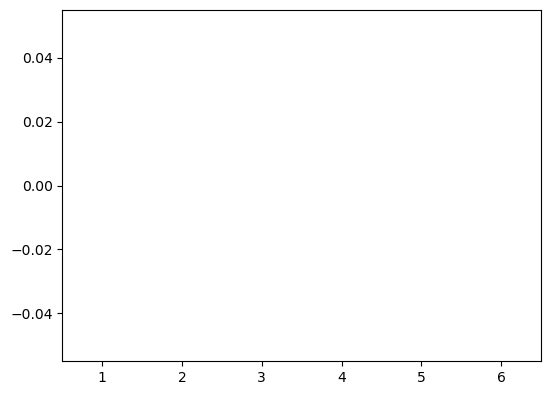

In [48]:

i=0; 
number_of_columns=3; number_of_rows= int(np.ceil(len(sublist_of_simulation_data_intransect)/number_of_columns))
plt.figure(figsize= (21,21))
for simulation_data in sublist_of_simulation_data_intransect:
        groupsizes= group_sizes
        key_for_dict= simulation_data["focal_bat"][0][0]*sign_based_on_distance_from_centermost_point[i]
        nbrs_detected_data= store_probability_of_detection_n_neighbour[key_for_dict]
        # print(nbrs_detected_data['median_echolevels'])
        plt.subplot(number_of_rows,number_of_columns,i+1)
        plt.boxplot(nbrs_detected_data['echolevels'][:], label=f"r={key_for_dict}");
        plt.vlines(range(1,len(nbrs_detected_data['95%ile_echolevels'])+1),nbrs_detected_data['5%ile_echolevels'],
                                                                        nbrs_detected_data['95%ile_echolevels'],
                                label='95% data interval')

        plt.plot(range(1,len(groupsizes)+1), nbrs_detected_data['median_echolevels'], linewidth=6, alpha=0.5,
                label='median detected echo level')
        plt.ylabel('Received level of detected echoes, \n dB SPL re 20$\mu Pa$',
                                                fontsize=10)
        plt.xticks(np.arange(1,len(groupsizes)+1), groupsizes, fontsize=10)
        plt.hlines([20],1,len(groupsizes)+1)
        plt.yticks(np.arange(20,86,6),np.arange(20,86,6), fontsize=10)
        plt.text(1,21,'Hearing threshold', fontsize=10)
        plt.xlabel('Group size', fontsize=10)
        plt.legend()
        # print(key_f
        # or_dict)
        i+=1

/tmp/ipykernel_224483/4001297594.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


6.0


/tmp/ipykernel_224483/4001297594.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_224483/4001297594.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_224483/4001297594.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_224483/4001297594.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_224483/4001297594.py:29: UserWarning: No artists with labels found to put in legend. 

6.0
6.0
6.0
6.0
6.0


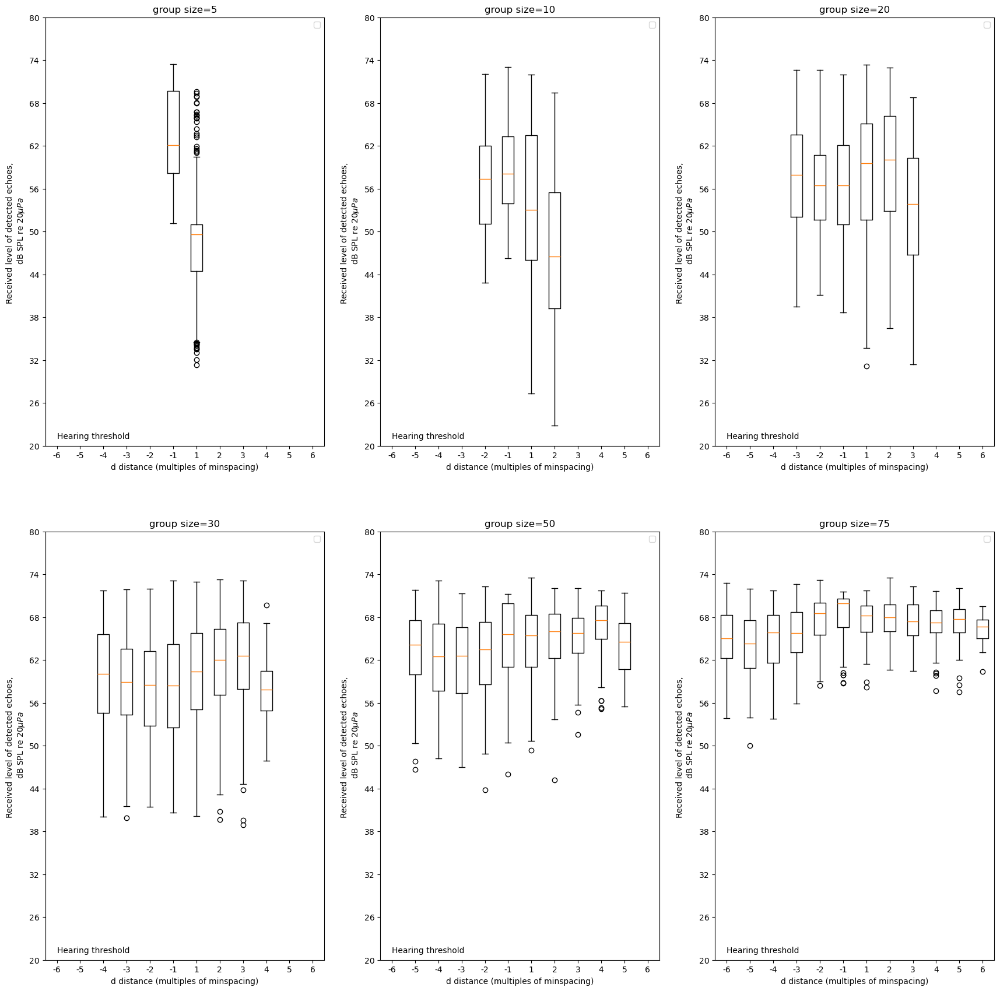

In [ ]:
store_probability_of_detection_n_neighbour= store_nbrs_across_heading_var[10]
i=0; 

d_distances_along_transect= np.arange(-6,7,1)
number_of_columns=3; number_of_rows= int(np.ceil(len(group_sizes)/number_of_columns))
plt.figure(figsize= (21,21))
for group_size in group_sizes:
        array_storing_info_for_plot= []
        iterant_sign=-1
        x_ticks=[]
        for key in d_distances_along_transect:
                if key==0:
                        continue
                iterant_sign+=1
                nbrs_detected_data= store_probability_of_detection_n_neighbour[key]
                data_to_store= nbrs_detected_data['echolevels'][group_sizes.index(group_size)]
                array_storing_info_for_plot.append(data_to_store)
                x_ticks.append(key)

        plt.subplot(number_of_rows,number_of_columns,i+1)
        plt.boxplot(array_storing_info_for_plot);

        plt.ylabel('Received level of detected echoes, \n dB SPL re 20$\mu Pa$',
                                                fontsize=10)
        plt.xticks(np.arange(1,len(x_ticks)+1), x_ticks, fontsize=10)
        plt.yticks(np.arange(20,86,6),np.arange(20,86,6), fontsize=10)
        plt.text(1,21,'Hearing threshold', fontsize=10)
        plt.xlabel('d distance (multiples of minspacing)', fontsize=10)
        plt.legend()
        plt.title(f"group size={group_size}")
        print(key_for_dict)
        i+=1

In [ ]:
store_probability_of_detection_n_neighbour.keys()

dict_keys([-6.0, -5.0, -4.0, -3.0, -2.0, -1.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0])

-6.0
-5.0
-4.0
-3.0
-2.0
-1.0
1.0
2.0
3.0
4.0
5.0
6.0


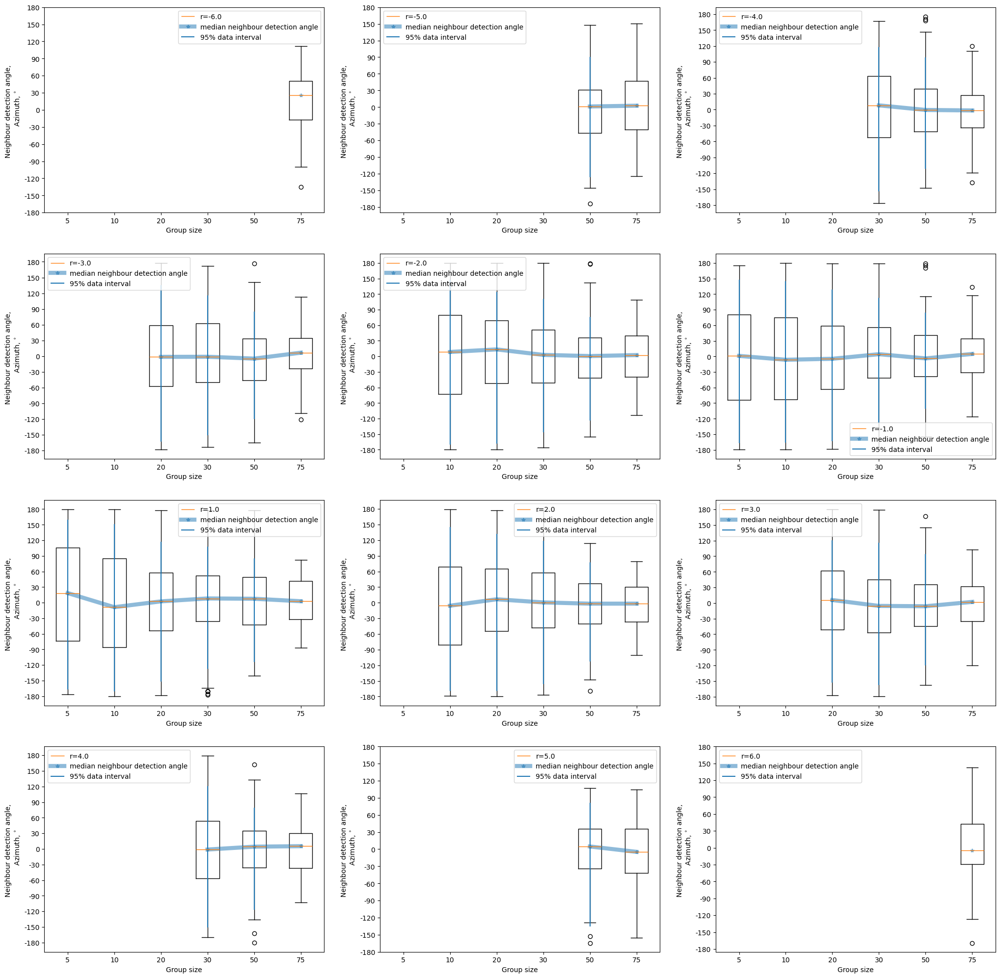

In [ ]:
i=0; 
number_of_columns=3; number_of_rows= int(np.ceil(len(sublist_of_simulation_data_intransect)/number_of_columns))
plt.figure(figsize= (25,25))
for simulation_data in sublist_of_simulation_data_intransect:
        groupsizes= group_sizes
        key_for_dict= simulation_data["focal_bat"][0][0]*sign_based_on_distance_from_centermost_point[i]
        nbrs_detected_data= store_probability_of_detection_n_neighbour[key_for_dict]

        plt.subplot(number_of_rows,number_of_columns,i+1)
        plt.boxplot(nbrs_detected_data['neighbours_azimuth'][:], label=f"r={key_for_dict}")
        plt.plot(np.arange(1,7), nbrs_detected_data['median_neighbours_azimuth'], '-*', linewidth=6,
                        alpha=0.5, label='median neighbour detection angle')
        plt.vlines(range(1,len(nbrs_detected_data['5%ile_neighbours_azimuth'])+1),nbrs_detected_data['5%ile_neighbours_azimuth'],
                nbrs_detected_data['95%ile_neighbours_azimuth'], label='95% data interval')
        #plt.plot(np.arange(1,8), nbrs_detected_data['95%ile_neighbours_azimuth'], 'g')
        #plt.plot(np.arange(1,8), nbrs_detected_data['5%ile_neighbours_azimuth'], 'g', label='95%  neighbour detection range')

        plt.yticks(np.arange(-180,210,30), np.arange(-180,210,30), fontsize=10)
        plt.xticks(np.arange(1,7), group_sizes, fontsize=10)
        plt.legend()
        plt.ylabel('Neighbour detection angle, \n  Azimuth, $^{\circ}$', fontsize=10)
        plt.xlabel('Group size', fontsize=10)


        print(key_for_dict)
        i+=1

(array([10., 20., 18., 31., 21., 24., 25., 19.,  9.,  4.]),
 array([-110.6244 ,  -86.20075,  -61.7771 ,  -37.35345,  -12.9298 ,
          11.49385,   35.9175 ,   60.34115,   84.7648 ,  109.18845,
         133.6121 ]),
 <BarContainer object of 10 artists>)

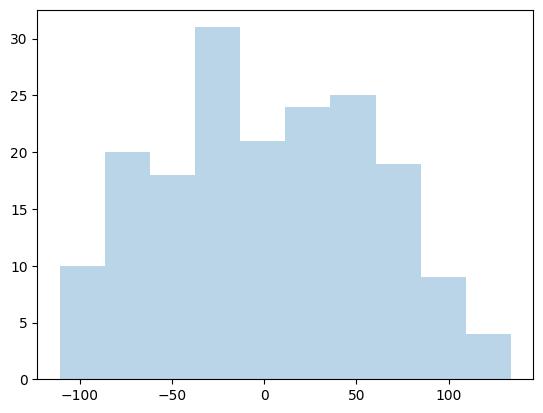

In [ ]:
nbrs_detected_data= store_probability_of_detection_n_neighbour[3]
plt.hist(nbrs_detected_data['neighbours_azimuth'][4], alpha=0.3)
# print(np.sum(plt.hist(nbrs_detected_data['neighbours_azimuth'][6])[0]))

/tmp/ipykernel_244814/3498775721.py:28: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_244814/3498775721.py:28: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_244814/3498775721.py:28: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_244814/3498775721.py:28: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()
/tmp/ipykernel_244814/3498775721.py:28: UserWarning: No artists with labels found to put in legend. 

-6.0
-6.0
-6.0
-6.0
-6.0
-6.0


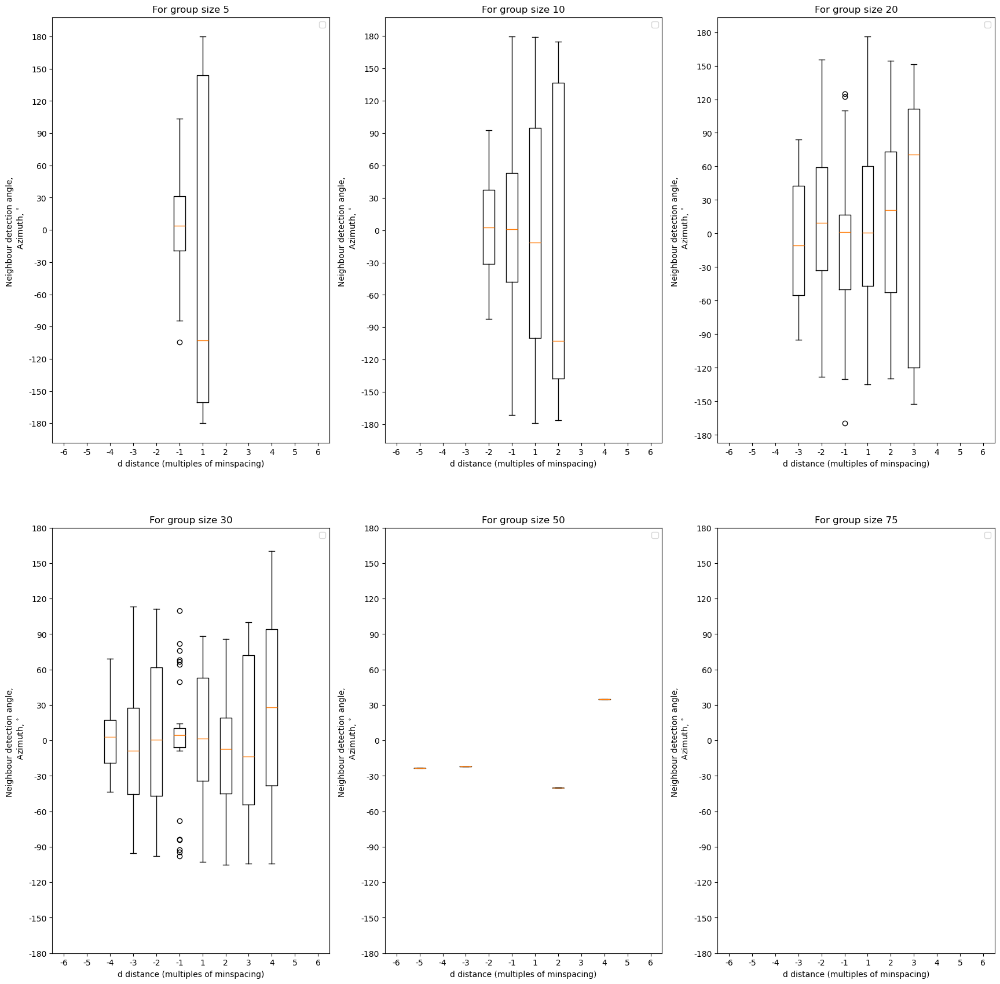

In [49]:
store_probability_of_detection_n_neighbour= store_nbrs_across_heading_var[10]
i=0; 
d_distances_along_transect= np.arange(-6,7,1)
number_of_columns=3; number_of_rows= int(np.ceil(len(group_sizes)/number_of_columns))
plt.figure(figsize= (21,21))
for group_size in group_sizes:
        array_storing_info_for_plot= []
        iterant_sign=-1
        x_ticks=[]
        for key in d_distances_along_transect:
                if key==0:
                        continue
                iterant_sign+=1
                nbrs_detected_data= store_probability_of_detection_n_neighbour[key]
                data_to_store= nbrs_detected_data['neighbours_azimuth'][group_sizes.index(group_size)]
                array_storing_info_for_plot.append(data_to_store)
                x_ticks.append(key)

        plt.subplot(number_of_rows,number_of_columns,i+1)
        plt.boxplot(array_storing_info_for_plot);

        plt.yticks(np.arange(-180,210,30), np.arange(-180,210,30), fontsize=10)
        plt.xticks(np.arange(1,len(x_ticks)+1), x_ticks, fontsize=10)

        plt.ylabel('Neighbour detection angle, \n  Azimuth, $^{\circ}$', fontsize=10)
        plt.xlabel('d distance (multiples of minspacing)', fontsize=10)
        plt.title(f"For group size {group_size}")
        plt.legend()
        print(key_for_dict)
        i+=1

In [50]:
def modify_dict_for_seaborn(input_dict,key_x,key_y):
    radial_dist= input_dict.keys()
    x,y,hue= [], [], []
    for r in radial_dist:
        data_to_plotted= input_dict[r]
        y_axis_raw= data_to_plotted[key_y]
        x_axis_raw= data_to_plotted[key_x]

        for index_group_sizes in range(len(x_axis_raw)):
            group_size= x_axis_raw[index_group_sizes]
            y_corresponding_to_group_size= y_axis_raw[index_group_sizes]
            # print(y_corresponding_to_group_size)
            for entry in y_corresponding_to_group_size:
                y.append(entry)
                x.append(group_size)
                hue.append(r)

    return x,y,hue

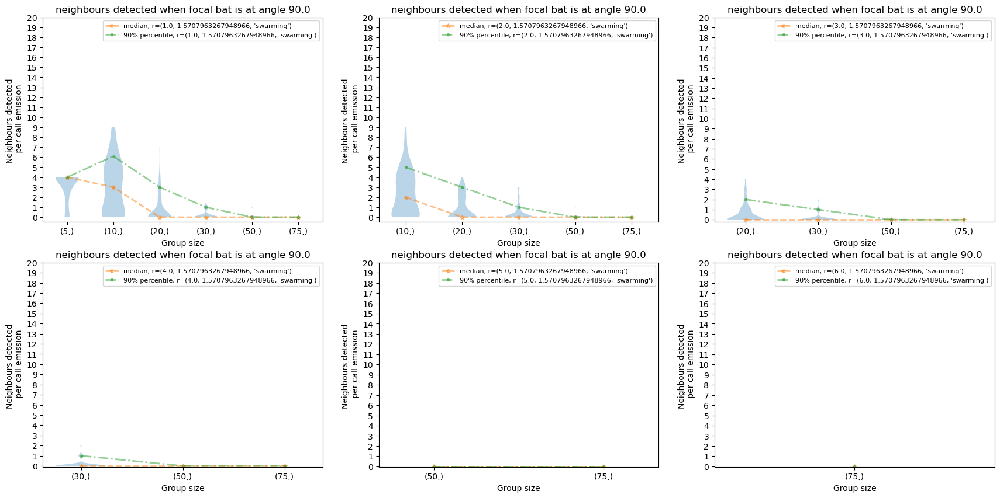

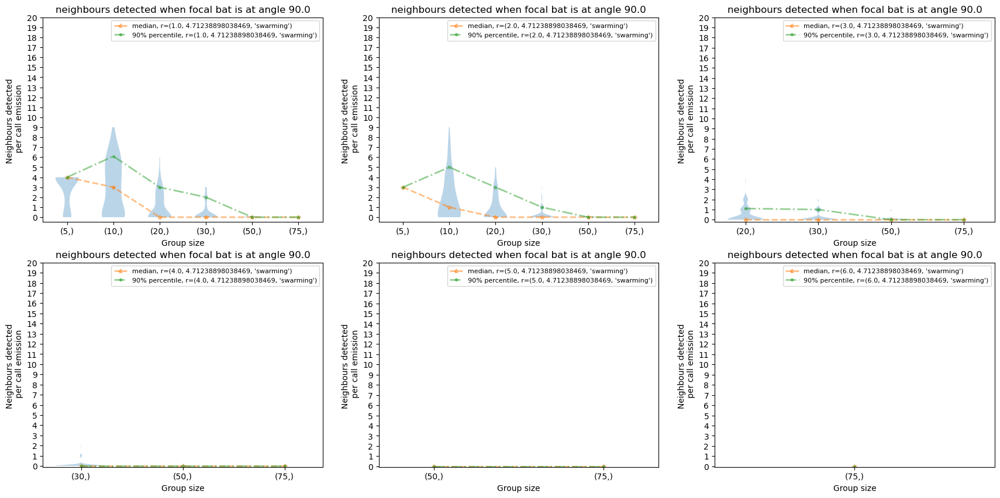

In [51]:
iterant1_axis=0
# fig, axs = plt.subplots(1,3, figsize=(27,9))


for angle in list_containing_simulated_data_sorted_by_angles.keys():
        subset_given_angle= list_containing_simulated_data_sorted_by_angles[angle][0]; iterant2_color=0
        
        plt.figure(figsize=(21,10))
        i=1
        for simulation_data in subset_given_angle:
                data_by_groupsize = simulation_data.groupby(['group_size'])
                nbrs_detected_data = {}
                nbrs_detected_data['num_nbrs'] = []
                nbrs_detected_data['median_num_nbrs'] = []
                nbrs_detected_data['90%ile_num_nbrs'] = []
                groupsizes= []
                for groupsize, dataframe in data_by_groupsize:
                        groupsizes.append(groupsize)
                        nbrs_detected_data['num_nbrs'].append(np.array(dataframe['nbrs_detected']))
                        nbrs_detected_data['median_num_nbrs'].append(np.median(np.array(dataframe['nbrs_detected'])))
                        nbrs_detected_data['90%ile_num_nbrs'].append(np.percentile(np.array(dataframe['nbrs_detected']), 90))

                breakup_x_axis  = np.arange(1,len(groupsizes)+1)+0.5
                nbrs_detected_data['median_num_nbrs']

                # plt.figure(figsize=(7,3.42))
                plt.subplot(2,3,i)
                plt.violinplot(nbrs_detected_data['num_nbrs'][:], showextrema=False)
                plt.plot(np.arange(1,len(groupsizes)+1),nbrs_detected_data['median_num_nbrs'][:],
                        '--*',linewidth=2, alpha=0.5,label="median, r="+str(simulation_data["focal_bat"][0]))#'median')
                # print(np.arange(1,len(groupsizes)))
                plt.plot(np.arange(1,len(groupsizes)+1), nbrs_detected_data['90%ile_num_nbrs'][:],
                        '-..',linewidth=2, alpha=0.5, label="90% percentile, r="+str(simulation_data["focal_bat"][0]))#label='90%ile')
                # plt.vlines(breakup_x_axis, -1,20, 'w',linewidth=30,alpha=1.0)
                plt.yticks(np.arange(0,21,1))
                plt.xticks(range(1,len(groupsizes)+1),groupsizes[:])
                plt.legend(fontsize=8)
                plt.ylabel('Neighbours detected \n per call emission', fontsize=10)
                plt.xlabel('Group size', fontsize=10)
                # # plt.ylim(0,20)

                # axs[i].tight_layout()
                plt.title("neighbours detected when focal bat is at angle "+str(np.degrees(np.pi/2)))
                iterant2_color+=1; i+=1
                
        iterant1_axis+=1
                # plt.savefig('Figure2_groupsize_1200dpi.pdf',
                #         bbox_inches='tight', pad_inches=0.05, format='pdf', dpi=1200)
        
        # print(groupsizes); print(nbrs_detected_data['median_num_nbrs'])

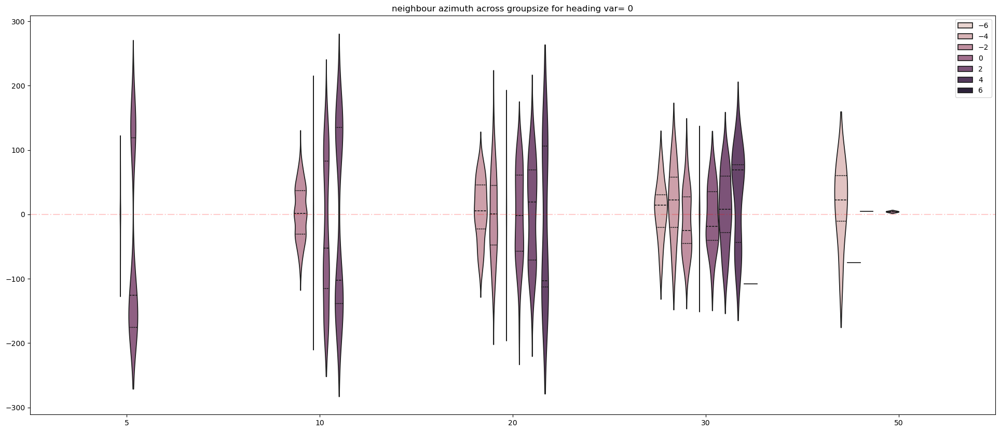

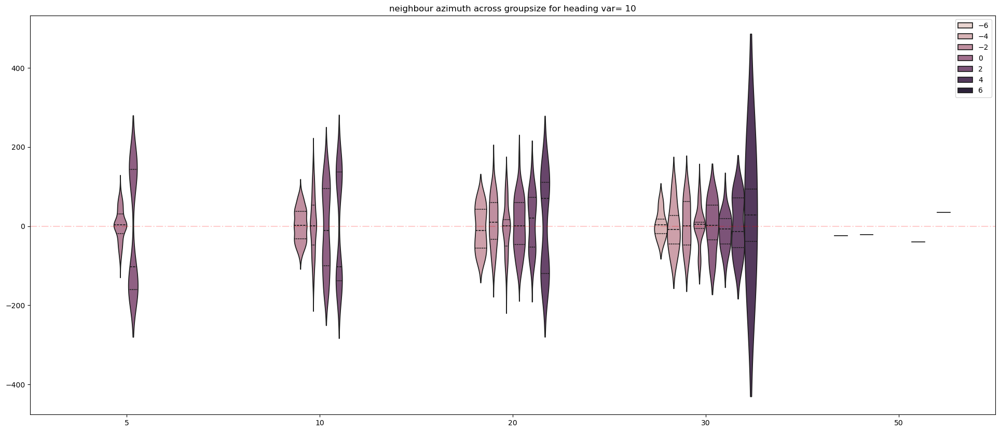

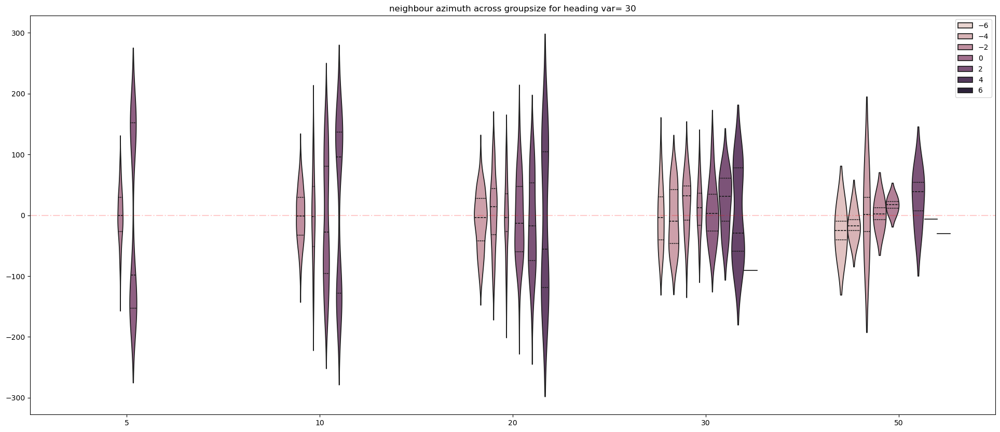

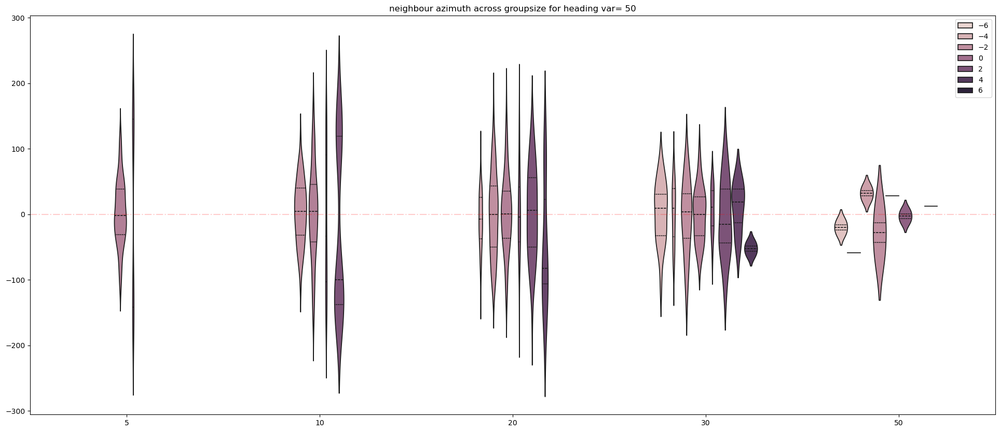

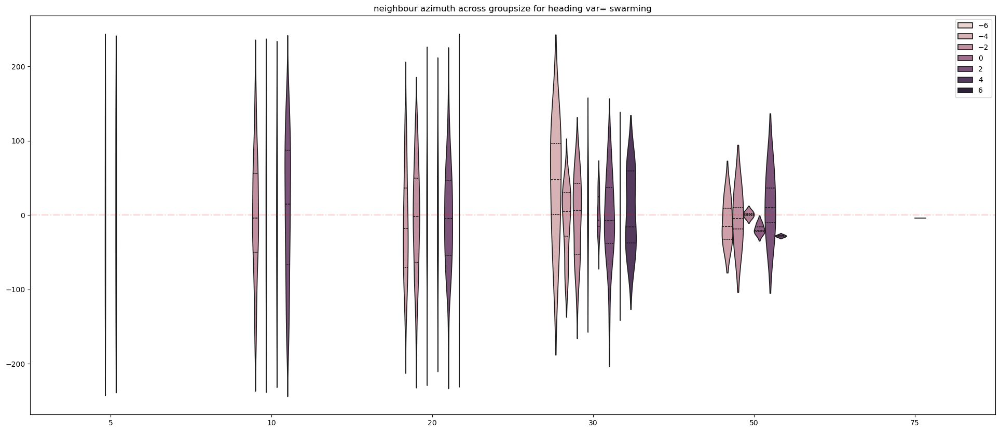

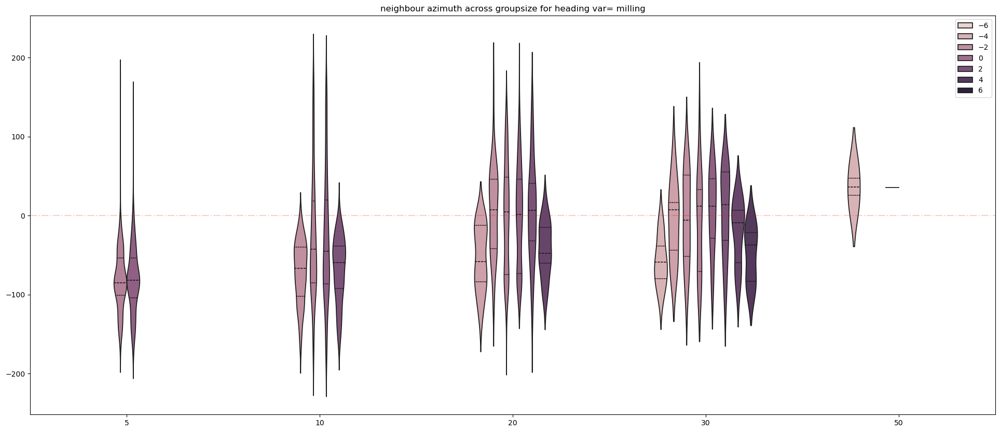

In [54]:
for heading_var in group_heading_variation:
    store_probability_of_detection_n_neighbour= store_nbrs_across_heading_var[heading_var]
    x,y,hue= modify_dict_for_seaborn(store_probability_of_detection_n_neighbour, "group_sizes", "neighbours_azimuth")
    plt.figure(figsize=(24,10))
    plt.axhline(0, ls= "-.", color="red", alpha=0.2)
    sns.violinplot(x=x, y=y, hue=hue, inner="quart", hue_order=store_probability_of_detection_n_neighbour.keys())
    plt.title("neighbour azimuth across groupsize for heading var= "+ str(heading_var))
# plt.ylim(-180,180)

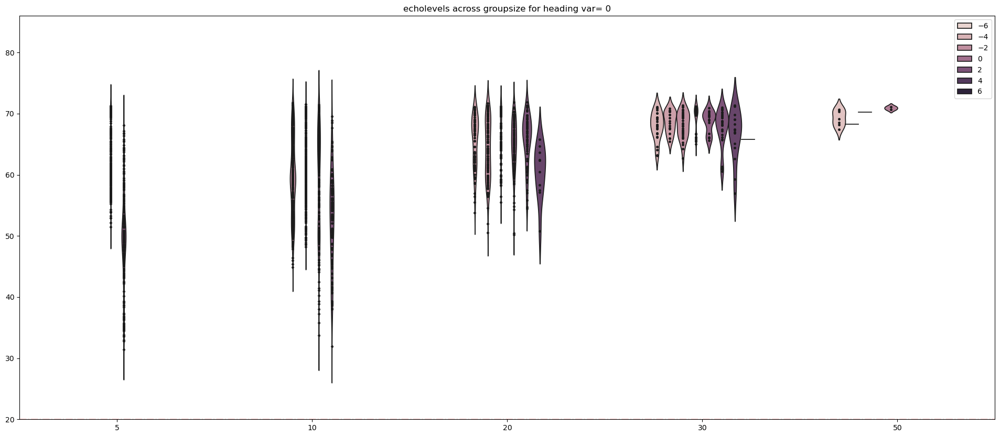

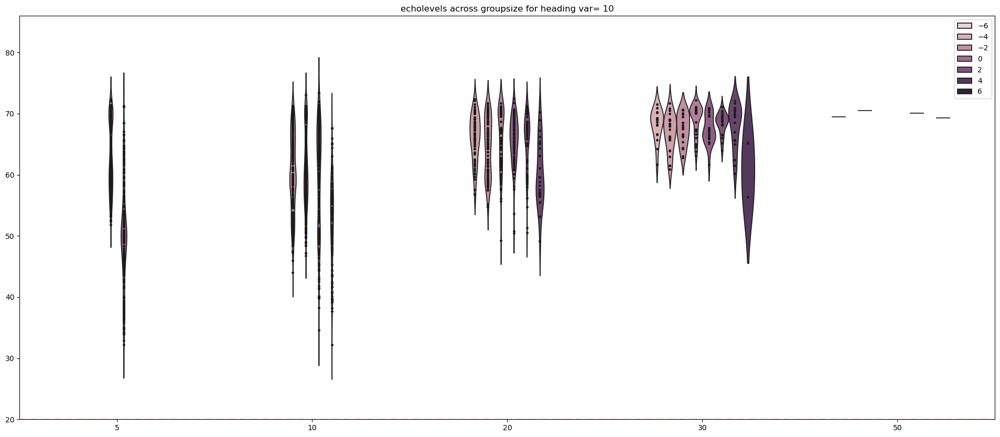

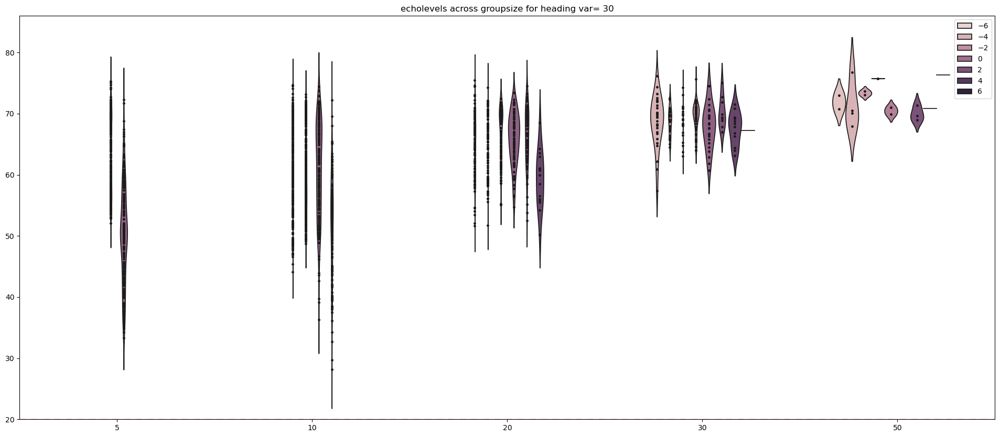

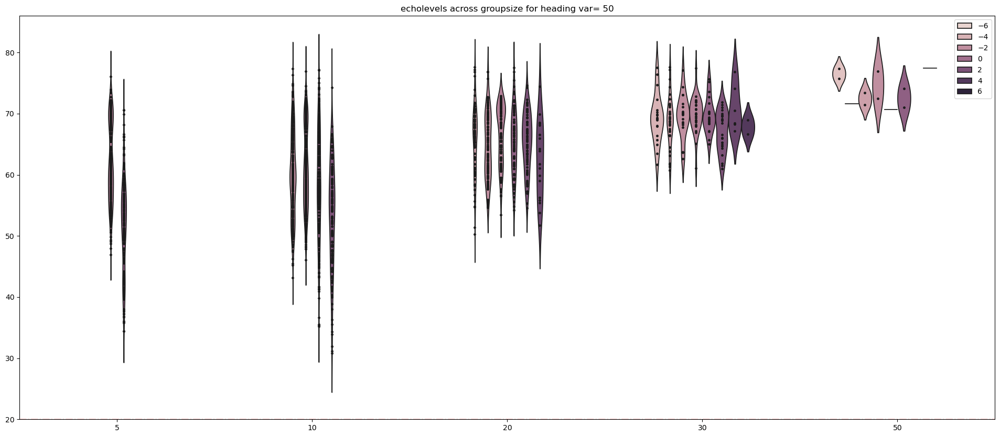

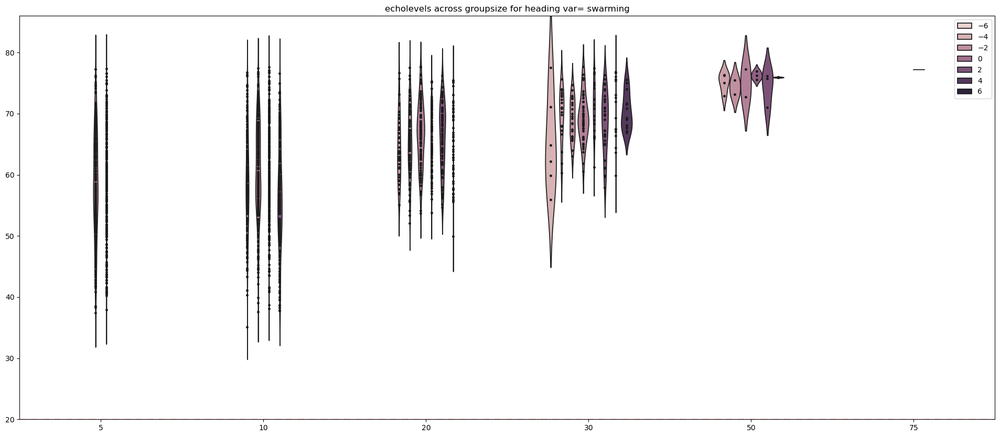

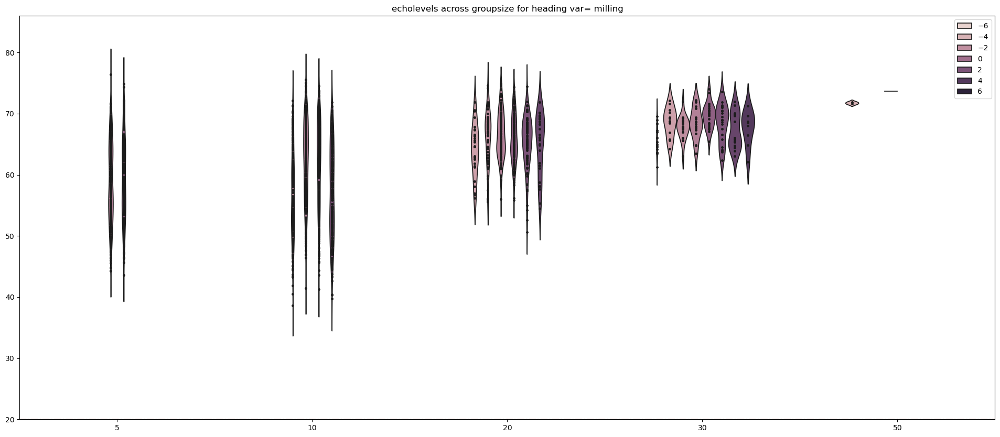

In [55]:
for heading_var in group_heading_variation:
    store_probability_of_detection_n_neighbour= store_nbrs_across_heading_var[heading_var]
    x,y,hue= modify_dict_for_seaborn(store_probability_of_detection_n_neighbour, "group_sizes", "echolevels")
    plt.figure(figsize=(24,10))
    plt.axhline(20, ls= "-.", color="red", alpha=0.2)
    sns.violinplot(x=x, y=y, hue=hue, inner="point", hue_order=store_probability_of_detection_n_neighbour.keys())
    plt.title("echolevels across groupsize for heading var= "+ str(heading_var))
    plt.ylim(20,86)


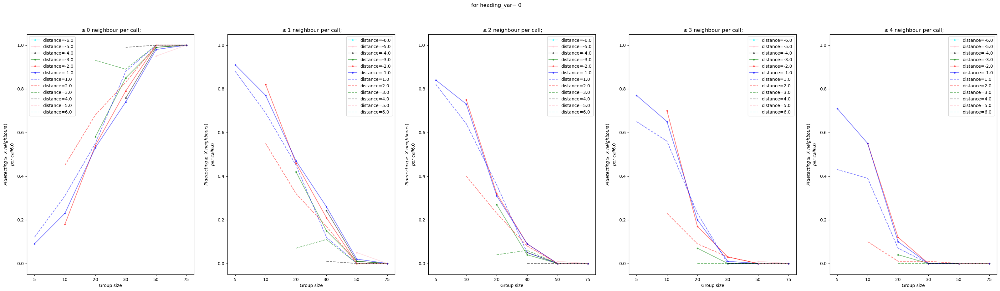

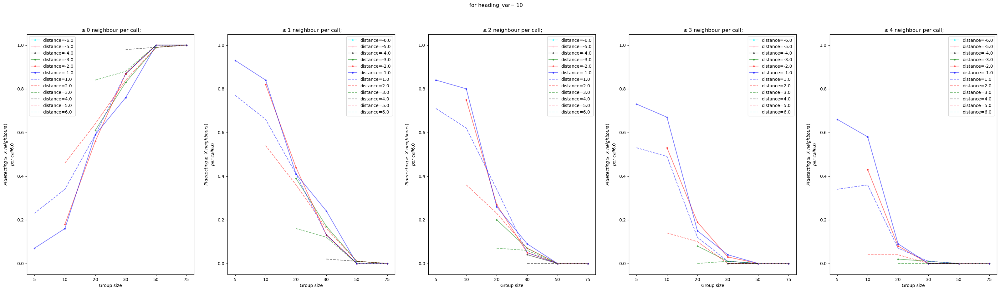

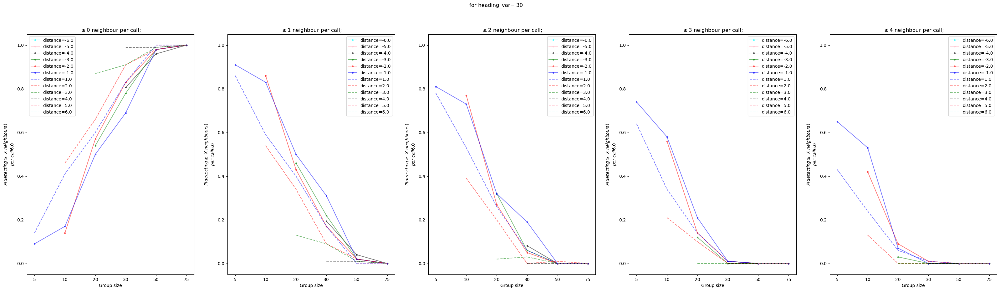

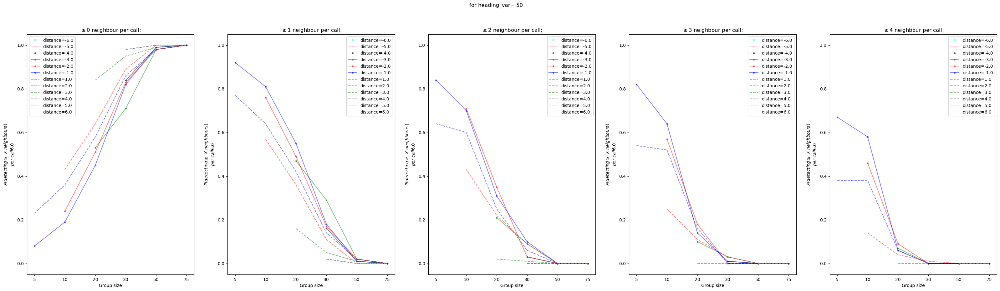

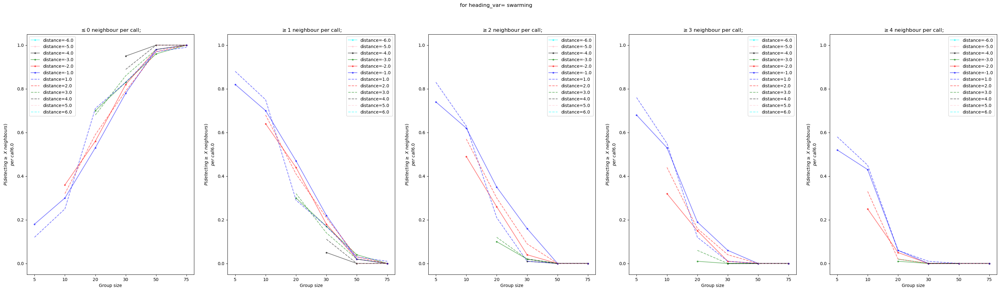

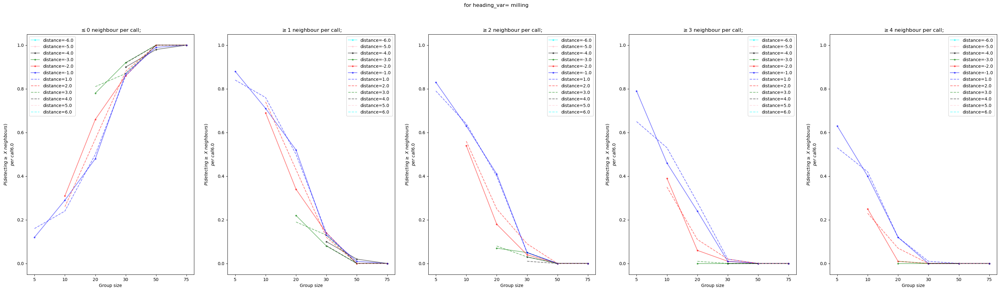

In [56]:
j=0

for heading_var in group_heading_variation:
        j=0
        plt.figure(figsize= (40,10))
        store_probability_of_detection_n_neighbour = store_nbrs_across_heading_var[heading_var]
        number_of_neighbours_atleast_detected= [0,1,2,3,4]
        i=0; 
        number_of_columns=5; number_of_rows= 1#int(np.ceil(len(number_of_neighbours_atleast_detected)/number_of_columns))
        

        for simulation_data in sublist_of_simulation_data_intransect:
                color_given_index= colors[int(float(simulation_data["focal_bat"][0][0]))-1]
                groupsizes= group_sizes

                key_for_dict= simulation_data["focal_bat"][0][0]*sign_based_on_distance_from_centermost_point[i]
                # print(key_for_dict)
                # print(simulation_data["focal_bat"][0][0])
                nbrs_detected_data= store_probability_of_detection_n_neighbour[key_for_dict]

                if sign_based_on_distance_from_centermost_point[i]<0:
                        ls= ".-"
                else:
                        ls= "--"

                plt.subplot(number_of_rows,number_of_columns,2+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_1neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color= color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,3+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_2neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,4+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_3neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,5+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_4neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,1+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['0neighbours'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                i+=1
        for i in range(1,6):
                if i==1:
                        plt.subplot(number_of_rows,number_of_columns,i+5*j)
                        plt.yticks(fontsize=10)
                        plt.xticks(np.arange(1,len(groupsizes)+1),
                                groupsizes,fontsize=10)
                        plt.legend()
                        plt.title(f"$\leq{i-1}$ neighbour per call;")
                else: 
                        plt.subplot(number_of_rows,number_of_columns,i+5*j)
                        plt.yticks(fontsize=10)
                        plt.xticks(np.arange(1,len(groupsizes)+1),
                                groupsizes,fontsize=10)
                        plt.legend()
                        plt.title(f"$\geq{i-1}$ neighbour per call;")
                plt.ylabel('$P(detecting \geq \ X \ neighbours)$'+'\n'+ '$per \ call$'+str(simulation_data["focal_bat"][0][0]),
                        fontsize=10)
                plt.xlabel('Group size',
                        fontsize=10)
                plt.ylim(-0.05,1.05)
        plt.suptitle("for heading_var= " + str(heading_var))
        j+=1
plt.show()

In [ ]:
j=0

for heading_var in group_heading_variation:
        j=0
        plt.figure(figsize= (40,10))
        store_probability_of_detection_n_neighbour = store_nbrs_across_heading_var[heading_var]
        number_of_neighbours_atleast_detected= [0,1,2,3,4]
        i=0; 
        number_of_columns=5; number_of_rows= 1#int(np.ceil(len(number_of_neighbours_atleast_detected)/number_of_columns))
        

        for simulation_data in sublist_of_simulation_data_intransect:
                color_given_index= colors[int(float(simulation_data["focal_bat"][0][0]))-1]
                groupsizes= group_sizes

                key_for_dict= simulation_data["focal_bat"][0][0]*sign_based_on_distance_from_centermost_point[i]
                # print(key_for_dict)
                # print(simulation_data["focal_bat"][0][0])
                nbrs_detected_data= store_probability_of_detection_n_neighbour[key_for_dict]

                if sign_based_on_distance_from_centermost_point[i]<0:
                        ls= ".-"
                else:
                        ls= "--"

                plt.subplot(number_of_rows,number_of_columns,2+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_1neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color= color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,3+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_2neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,4+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_3neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,5+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['geq_4neighbour'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                
                plt.subplot(number_of_rows,number_of_columns,1+5*j)
                plt.plot(np.arange(1,len(groupsizes)+1), 
                        nbrs_detected_data['0neighbours'], ls, alpha=0.5, label=f'distance={key_for_dict}', color=color_given_index)
                i+=1
        for i in range(1,6):
                if i==1:
                        plt.subplot(number_of_rows,number_of_columns,i+5*j)
                        plt.yticks(fontsize=10)
                        plt.xticks(np.arange(1,len(groupsizes)+1),
                                groupsizes,fontsize=10)
                        plt.legend()
                        plt.title(f"$\leq{i-1}$ neighbour per call;")
                else: 
                        plt.subplot(number_of_rows,number_of_columns,i+5*j)
                        plt.yticks(fontsize=10)
                        plt.xticks(np.arange(1,len(groupsizes)+1),
                                groupsizes,fontsize=10)
                        plt.legend()
                        plt.title(f"$\geq{i-1}$ neighbour per call;")
                plt.ylabel('$P(detecting \geq \ X \ neighbours)$'+'\n'+ '$per \ call$'+str(simulation_data["focal_bat"][0][0]),
                        fontsize=10)
                plt.xlabel('Group size',
                        fontsize=10)
                plt.ylim(-0.05,1.05)
        plt.suptitle("for heading_var= " + str(heading_var))
        j+=1
plt.show()